# Business Objective:

Data provided is related to gold prices. The objective is to understand the
underlying structure in your dataset and come up with a suitable forecasting
model which can effectively forecast gold prices for next 30 days.
This forecast model will be used by gold exporting and gold importing companies
to understand the metal price movements and accordingly set their revenue
expectations.


In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sn 
import plotly
from chart_studio import plotly
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.express as px
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.graphics.tsaplots as tsa_plots
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
from sklearn.model_selection import train_test_split
import statsmodels.formula.api as smf 
from statsmodels.tsa.holtwinters import SimpleExpSmoothing,Holt,ExponentialSmoothing
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error,mean_absolute_error,accuracy_score
from math import sqrt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from scipy.stats import boxcox
import warnings
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
import datetime
import warnings
warnings.filterwarnings('ignore')
import calendar
import itertools
import statsmodels.api as sm
import pickle
from datetime import date

In [2]:
df_gold = pd.read_csv(r"Gold_data.csv")

In [3]:
df_gold.head()

,date,price
0,2016-01-01,2252.60
1,2016-01-02,2454.50
2,2016-01-03,2708.10
3,2016-01-04,2577.80
4,2016-01-05,2597.75


## Data Exploration

In [4]:
#checking with the information of data 
df_gold.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2182 entries, 0 to 2181
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   date    2182 non-null   object 
 1   price   2182 non-null   float64
dtypes: float64(1), object(1)
memory usage: 34.2+ KB


In [5]:
#checking with null values or missing values 
df_gold.isnull().sum()

date     0
price    0
dtype: int64

In [6]:
#checking with any duplicate data 
df_gold[df_gold.duplicated()]

,date,price


<Axes: >

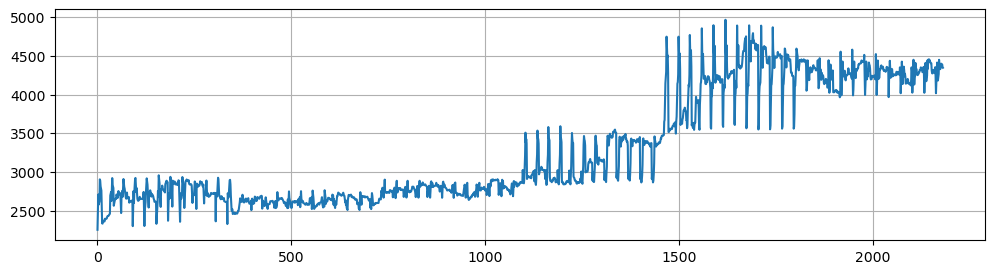

In [7]:
#checking with timeseries of gold prices for observation of trends 
df_gold.price.plot(figsize=(12,3),grid = "line")

 ## Observation
 
 - We observe that we have a non-linear exponential trend , that is upward trend and Additive seasonality with the prices of gold,since the  variations in the magnitude are not more than 10%.
 
 
 - we observe that there is variance in the mean and variance with the prices which indicates are data is non-stationary 
 
 
 - we also observe many factors relate to the inflation in the prices of gold such as natural occurrences, demand and supply issues or other duty crisis

In [8]:
#checking with unique values 
df_gold.nunique()

date     2182
price    1876
dtype: int64

In [9]:
#checking with descriptive statistics 
df_gold.describe().T

,count,mean,std,min,25%,50%,75%,max
price,2182.0,3284.450046,719.564434,2252.6,2697.02,2879.8,4147.325,4966.3


## EDA 

 - Feature Analysis

In [10]:
#extracting the month and year features
df_gold['date'] = pd.to_datetime(df_gold.date,format="%Y-%m-%d")
df_gold['month']  = df_gold.date.dt.strftime("%b")
df_gold['year'] = df_gold.date.dt.year

In [11]:
df_gold.head()

,date,price,month,year
0,2016-01-01,2252.60,Jan,2016
1,2016-01-02,2454.50,Jan,2016
2,2016-01-03,2708.10,Jan,2016
3,2016-01-04,2577.80,Jan,2016
4,2016-01-05,2597.75,Jan,2016


In [12]:
#saving our data for  visualizations 
df_gold1 = df_gold[['date','price']]

<Axes: xlabel='month', ylabel='year'>

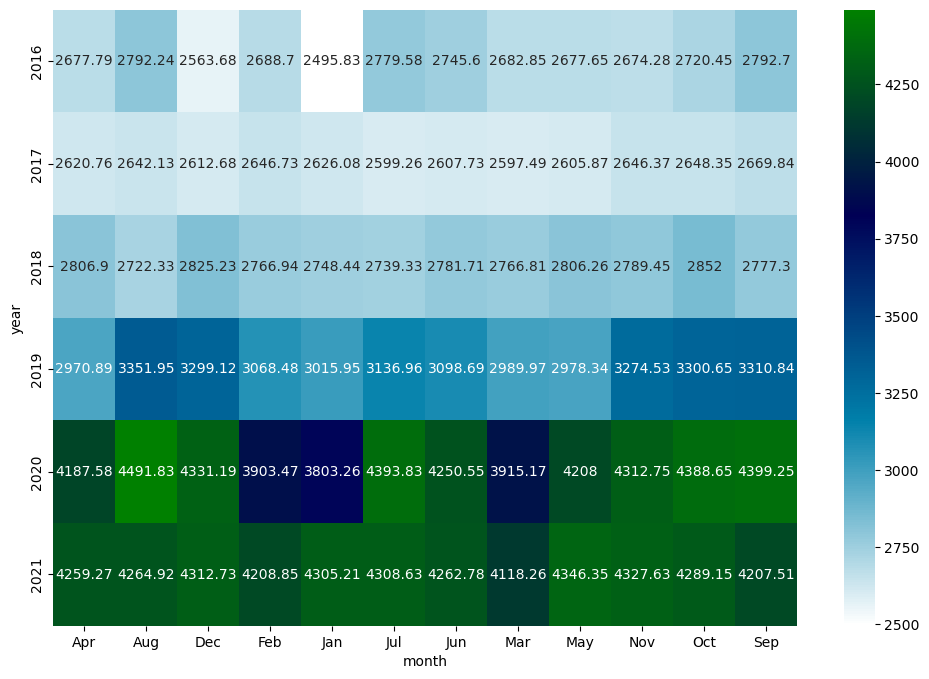

In [13]:
#checking with correlation matrix of prices 
plt.figure(figsize=(12,8))
heatmap_gold = pd.pivot_table(data=df_gold,values="price",index="year",columns="month",aggfunc="mean",fill_value=0)
sn.heatmap(heatmap_gold,annot=True,fmt="g",cmap='ocean_r')

## Observation

- We observe that the prices of gold have been rising from 2019 to 2021 when compared from 2016 but in the year 2020 we observe that the gold rates have dipped in the months of February ,January and March


- We also observe that in the year 2016,2017 and 2018 the prices of gold have very minimal variance of prices, this tells us that in these years the demand was less and supply was more.



- as the years have passed the demand for gold is higher which has seen a rising peak in the prices of gold, this gives us that as demand is higher and supply is lower the prices hike



<Axes: xlabel='year', ylabel='price'>

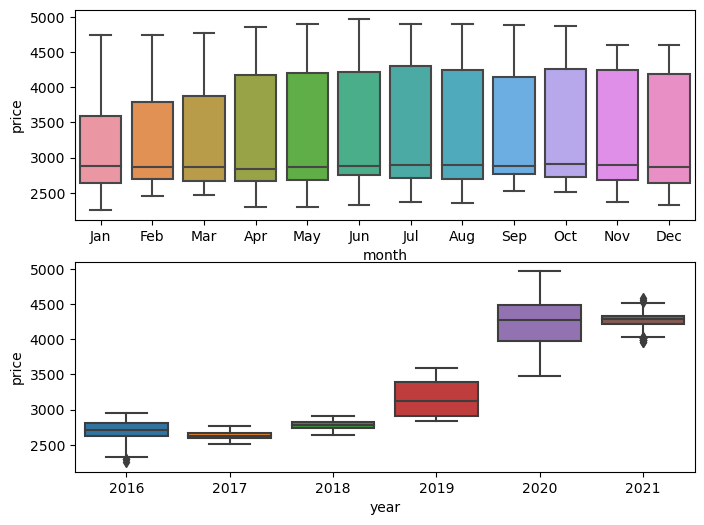

In [14]:
#boxplot for year and month 
plt.figure(figsize=(8,6))
plt.subplot(211)
sn.boxplot(x = "month",y = "price",data = df_gold)
plt.subplot(212)
sn.boxplot(x = "year",y = "price",data = df_gold)

## Observation 

- We observe that the distance of outliers are very minimal and our box plots look good so we go ahead without treating the outliers



<Axes: ylabel='Density'>

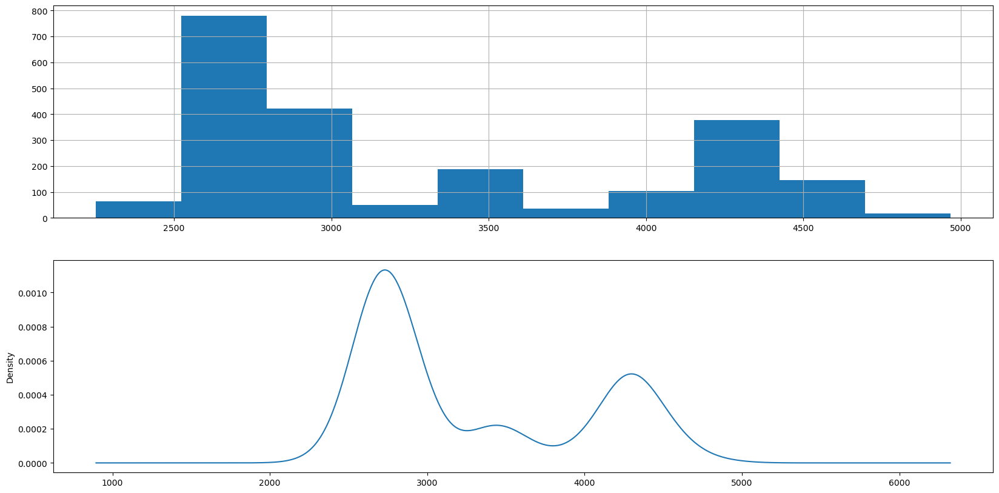

In [15]:
#checking with prices density and histogram plots 
plt.figure(figsize=(20,10))
plt.subplot(211)
df_gold.price.hist()
plt.subplot(212)
df_gold.price.plot(kind = 'kde')

## Observation 
 - We observe that the prices are rightly skewed distributed and has variance at mean which explains that our data is not stationary, also the distribution is bimodal distribution. 

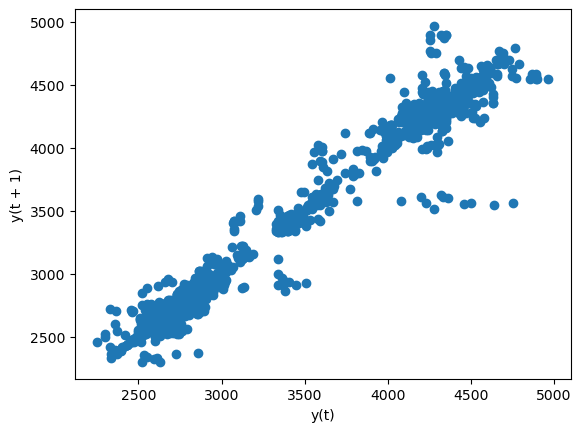

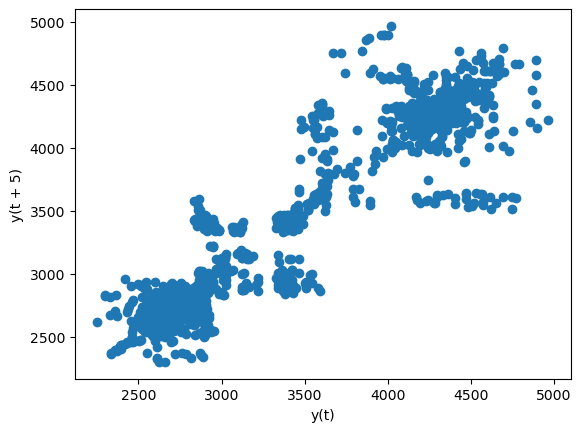

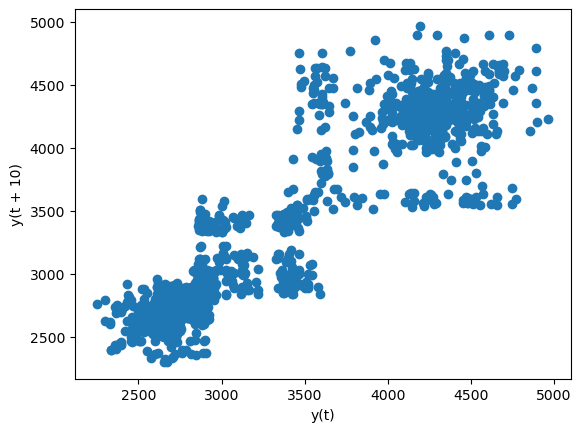

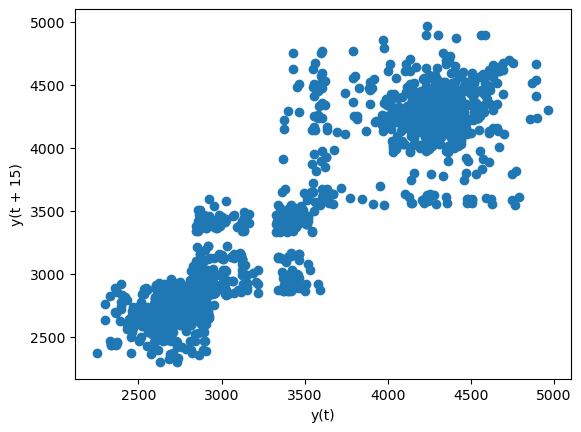

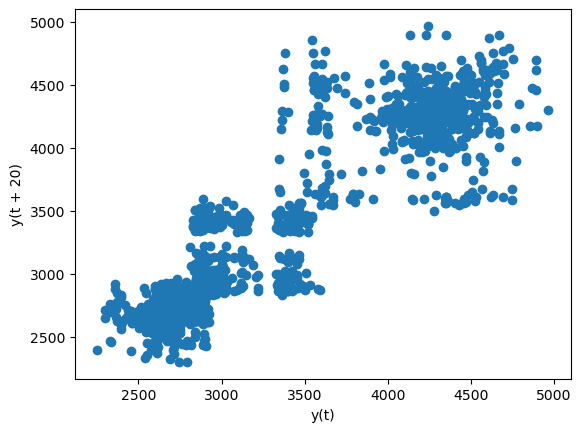

...

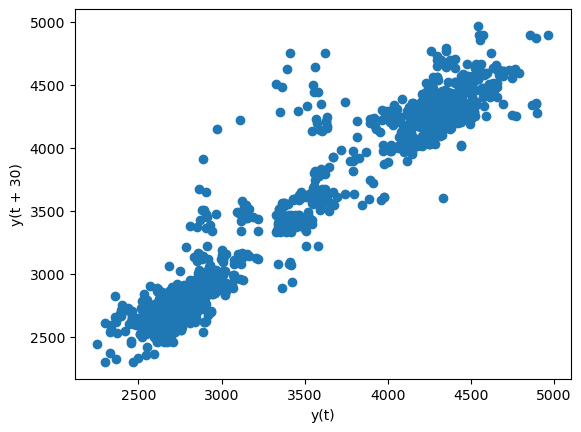

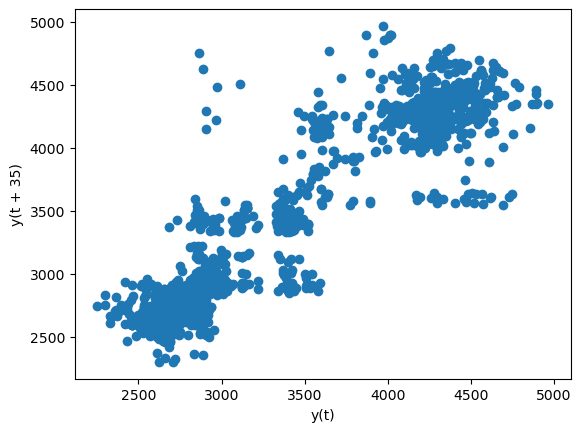

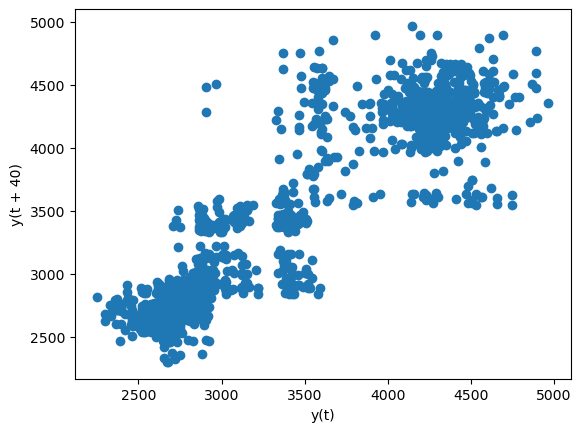

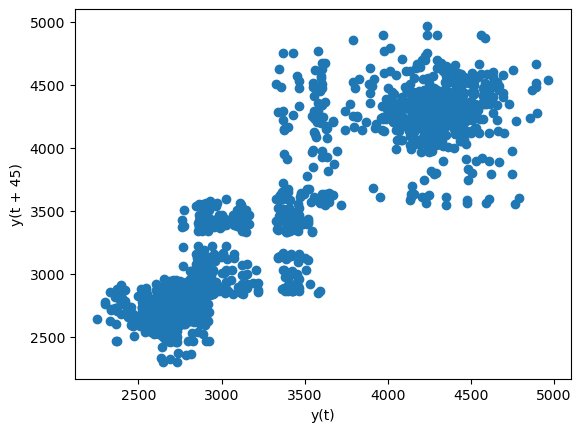

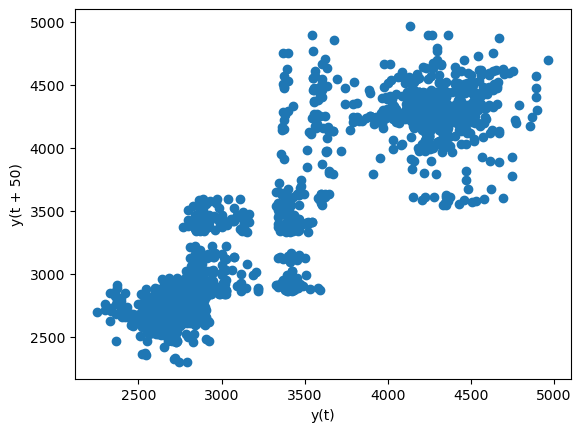

In [16]:
#Lag plot for passengers
for i in [1,5,10,15,20,25,30,35,40,45,50]:
    pd.plotting.lag_plot(df_gold.price,lag = i)
    plt.show()

## Observation

- we observe that there is a positive correlation of prices at given intervals of time and this tells us that weekly the prices of gold change

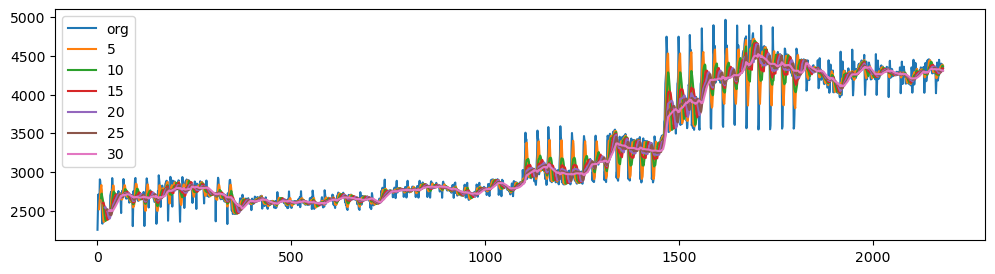

In [17]:
#plotting moving average with trends with matplotlib
plt.figure(figsize=(12,3))
df_gold.price.plot(label="org")
for i in range(5,35,5):
    df_gold["price"].rolling(i).mean().plot(label=str(i))
plt.legend(loc='best')

## Observation 
 - According to the moving averages we observe upward trend in the and the volatility between the prices is very high 
 


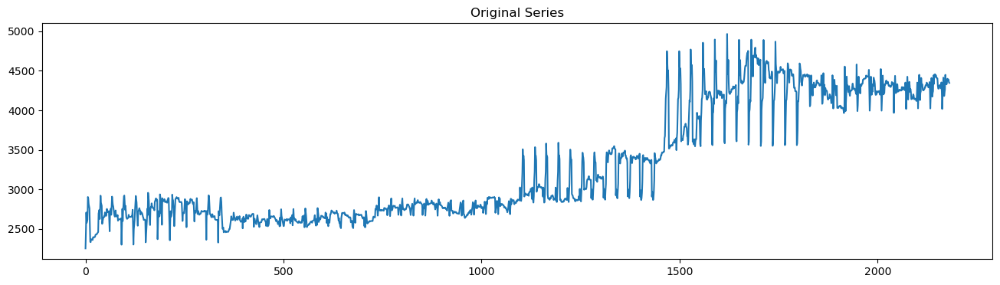

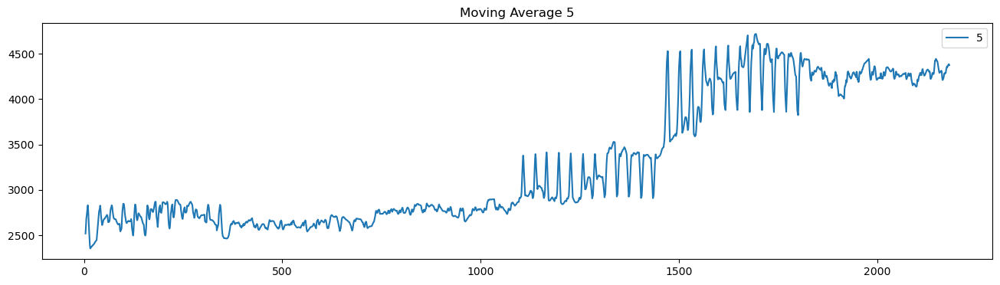

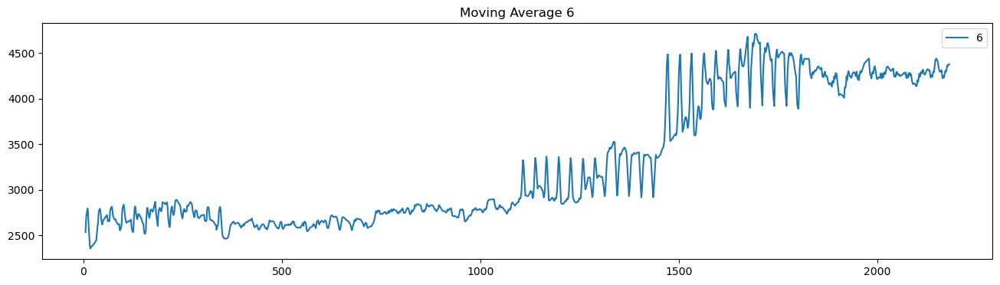

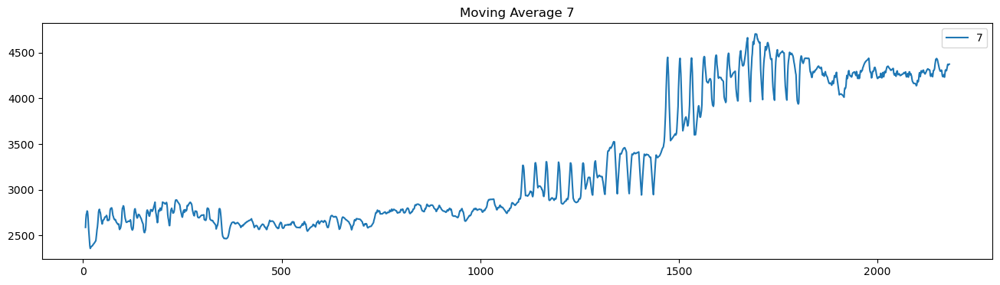

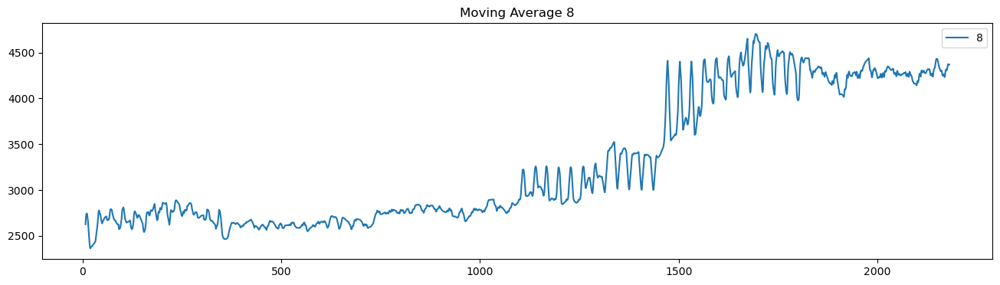

...

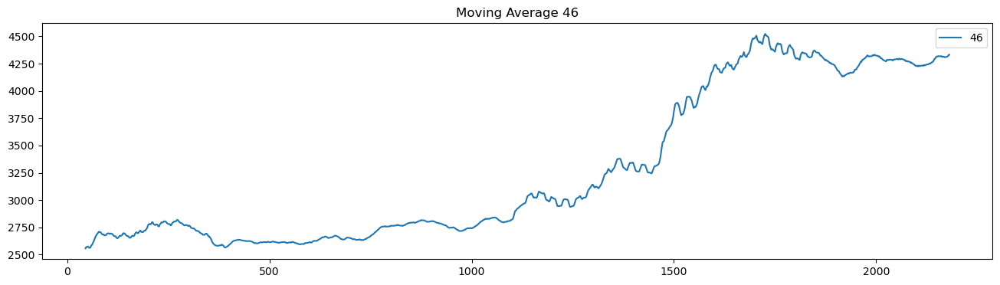

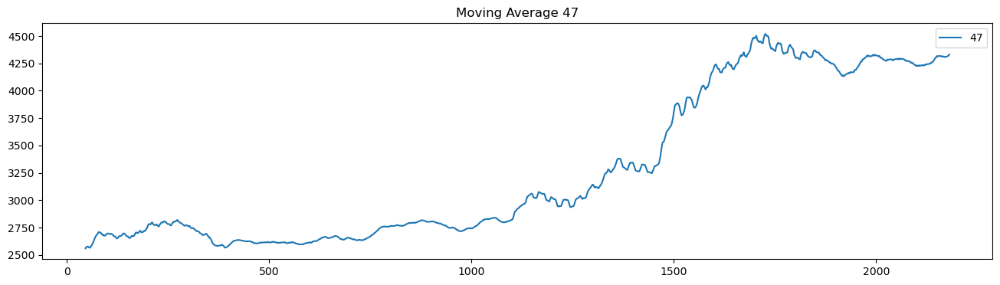

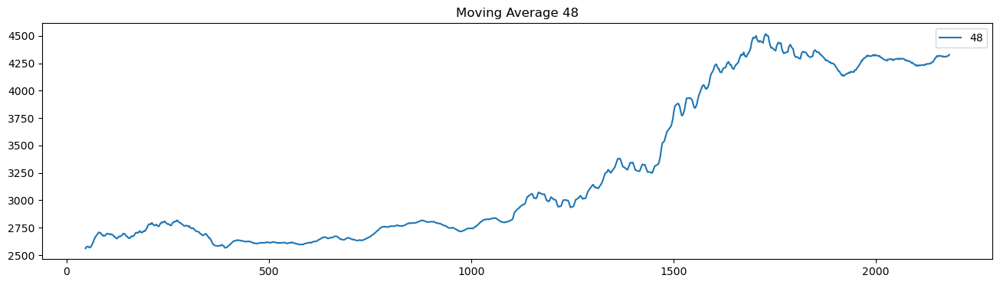

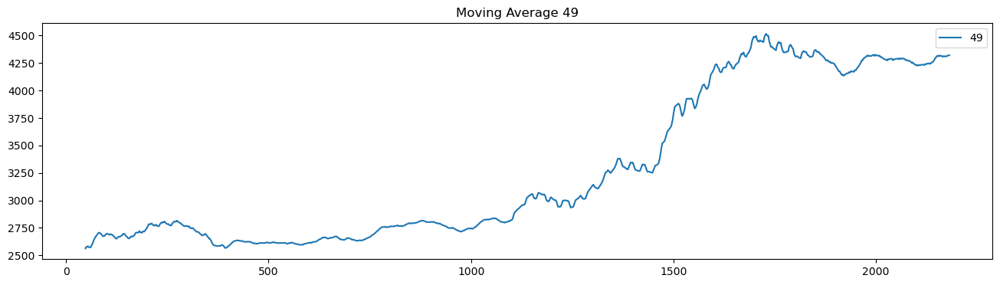

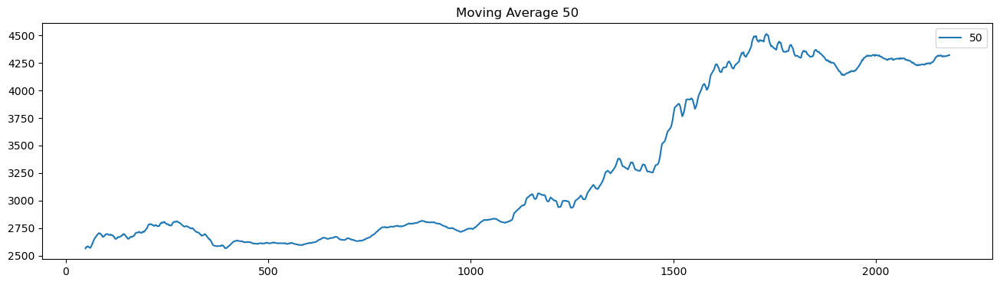

In [18]:
#moving average with independent trends 
plt.figure(figsize=(16,4))
df_gold.price.plot(label="org")
plt.title("Original Series")
for i in range(5,51):
    plt.figure(figsize=(16,4))
    df_gold["price"].rolling(i).mean().plot(label=str(i))
    plt.title("Moving Average "+str(i))
    plt.legend(loc='best')
    plt.show()

## Observation 

 - A rising moving average indicates that security is in an upward trend and we observe that the price of gold has an inclination, which indicates that in future the prices will be rising. 
 
 
 
 

In [19]:
#Time series decomposition plot with plotly additive

ts = df_gold.price

result = seasonal_decompose(ts, model='additive', period=30)

fig = go.Figure()

fig.add_trace(go.Scatter(x=ts.index, y=ts, name='Original'))

fig.add_trace(go.Scatter(x=result.trend.index, y=result.trend, name='Trend'))

fig.add_trace(go.Scatter(x=result.seasonal.index, y=result.seasonal, name='Seasonal'))

fig.add_trace(go.Scatter(x=result.resid.index, y=result.resid, name='Residual'))

fig.update_layout(
    title='Decomposition Plot Additive',
    xaxis_title='Date',
    yaxis_title='Value',
)

fig.show()


In [20]:
#Time series decomposition plot with plotly Multiplicative

ts = df_gold.price

result = seasonal_decompose(ts, model='multiplicative', period=30)

fig = go.Figure()

fig.add_trace(go.Scatter(x=ts.index, y=ts, name='Original'))

fig.add_trace(go.Scatter(x=result.trend.index, y=result.trend, name='Trend'))

fig.add_trace(go.Scatter(x=result.seasonal.index, y=result.seasonal, name='Seasonal'))

fig.add_trace(go.Scatter(x=result.resid.index, y=result.resid, name='Residual'))

fig.update_layout(
    title='Decomposition Plot Multiplicative',
    xaxis_title='Date',
    yaxis_title='Value',
)

fig.show()


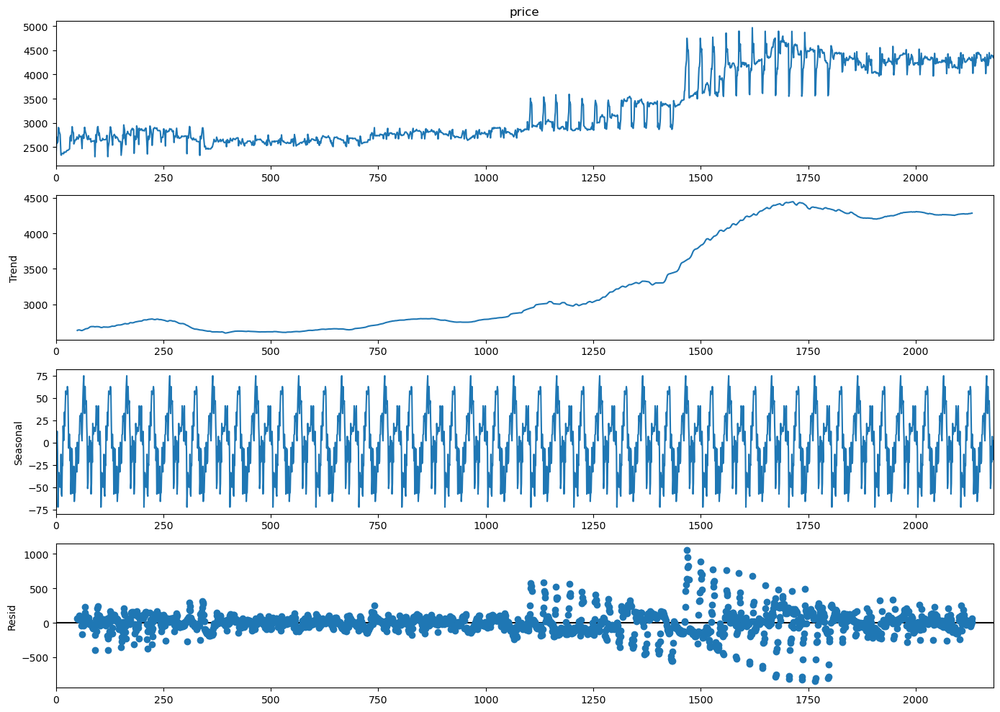

In [21]:
#decomposition times series plot 
decompose_ts_add = seasonal_decompose(df_gold.price,period=100)
with plt.rc_context():
    plt.rc("figure", figsize=(14,10))
    decompose_ts_add.plot()
    plt.show()

## Observations 

- We observe that with  decomposition plots that the trend is upward and seasonality is Additive and the variations with the residuals error is also lower.


- the decomposition plot also gives us the clear vision of trend, seasonality and residuals of gold prices for forecasting for future


- We can also observe that  we have Additive seasonality and residuals are affected by the upward trend of prices

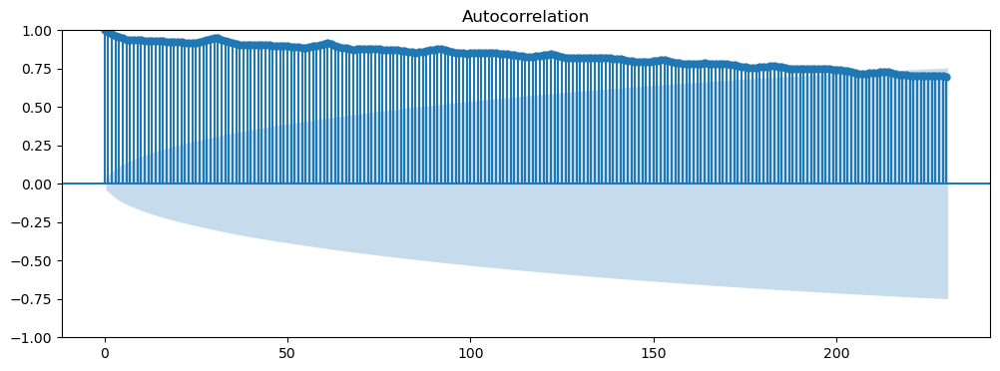

In [22]:
#Acf plot for gold price
with plt.rc_context():
    plt.rc("figure", figsize=(12,4))
    tsa_plots.plot_acf(df_gold.price,lags= 230)
    plt.show()

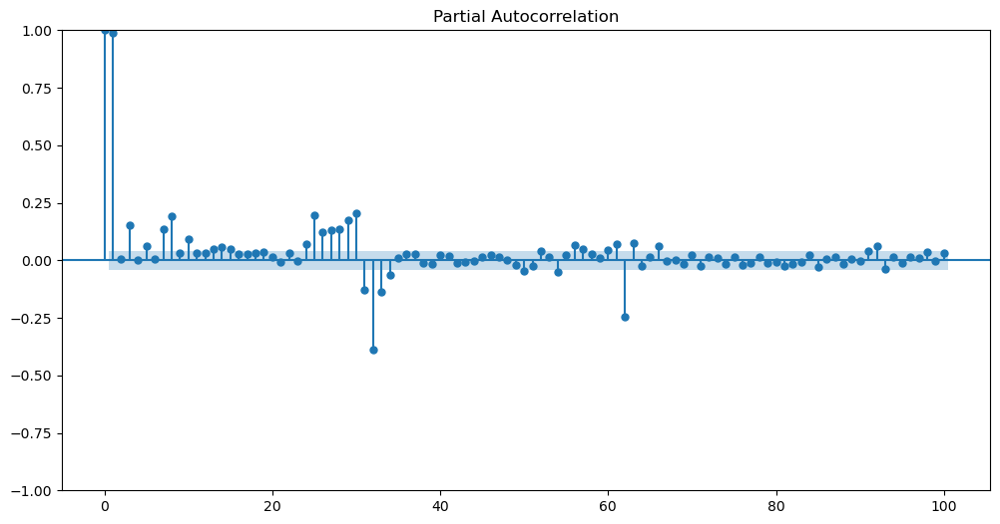

In [23]:
# PACF Plot    
with plt.rc_context():
    plt.rc("figure", figsize=(12,6))
    tsa_plots.plot_pacf(df_gold.price,lags= 100,alpha=.05,use_vlines=True)
    plt.show()

## Observation 

- We observe that in ACF plot we observe that our data has a strong correlation and is valid to forecast around 230 days, after 230 days the correlation coefficient falls inside the blue line or the critical value set.In the context of gold prices, this would suggest that the current price of gold is strongly influenced by its past prices at different lags. This may indicate the presence of a consistent pattern or trend in the data that persists over time.


- In partial correlation it displays us the autocorrelation or direct relationship between the timeseries observation and its own lagged values and here we observe that most of our data have either positive or negative correlation and have a great impact on our data. the pacf plot also captures seasonality and here we observe not much variation in magnitude, that tells us that the seasonality is additive seasonality.

In [24]:
#extracting some more features for deep analysis 
df_gold1['date'] = pd.to_datetime(df_gold1['date'])
df_gold1['year'] = df_gold1['date'].dt.year
df_gold1['month'] = df_gold1['date'].dt.month
df_gold1['week'] = df_gold1['date'].dt.isocalendar().week
df_gold1['quarter'] = df_gold1['date'].dt.quarter
df_gold1['day_of_week'] = df_gold1['date'].dt.day_name()


## Sampling with Respect to Month

 - Linear Interpolation

In [25]:
#resampling according to Month 
df_gold2 = df_gold[['date','price']]
samp_gold =  df_gold2.set_index('date').resample('M').mean() 
print(samp_gold.head(13))


                  price
date                   
2016-01-31  2495.832258
2016-02-29  2688.703448
2016-03-31  2682.854839
2016-04-30  2677.790000
2016-05-31  2677.650000
2016-06-30  2745.596667
2016-07-31  2779.582258
2016-08-31  2792.240323
2016-09-30  2792.705000
2016-10-31  2720.454839
2016-11-30  2674.280000
2016-12-31  2563.683333
2017-01-31  2626.077957


In [26]:
 ## interplation was done for nan values which we get after doing upsampling by month
inter_month = samp_gold.interpolate(method='linear')
print(inter_month.head(15))


                  price
date                   
2016-01-31  2495.832258
2016-02-29  2688.703448
2016-03-31  2682.854839
2016-04-30  2677.790000
2016-05-31  2677.650000
2016-06-30  2745.596667
2016-07-31  2779.582258
2016-08-31  2792.240323
2016-09-30  2792.705000
2016-10-31  2720.454839
2016-11-30  2674.280000
2016-12-31  2563.683333
2017-01-31  2626.077957
2017-02-28  2646.730357
2017-03-31  2597.485484


In [27]:
#resetting our index for extracting information
df_gold3 = inter_month.copy()
df_gold3 = df_gold3.reset_index()

In [28]:
#extracting some more features for deep analysis 
df_gold3['date'] = pd.to_datetime(df_gold3['date'])
df_gold3['year'] = df_gold3['date'].dt.year
df_gold3['month'] = df_gold3['date'].dt.month
df_gold3['week'] = df_gold3['date'].dt.isocalendar().week
df_gold3['quarter'] = df_gold3['date'].dt.quarter
df_gold3['day_of_week'] = df_gold3['date'].dt.day_name()

df_gold3.head()

,date,price,year,month,week,quarter,day_of_week
0,2016-01-31,2495.832258,2016,1,4,1,Sunday
1,2016-02-29,2688.703448,2016,2,9,1,Monday
2,2016-03-31,2682.854839,2016,3,13,1,Thursday
3,2016-04-30,2677.790000,2016,4,17,2,Saturday
4,2016-05-31,2677.650000,2016,5,22,2,Tuesday


In [29]:
#plotting Average gold prices for each year
df_2016 = df_gold3[df_gold3['year']==2016][['month','price']]
df_2016 = df_2016.groupby('month').agg({"price" : "mean"}).reset_index().rename(columns={'price':'2016'})
df_2017 = df_gold3[df_gold3['year']==2017][['month','price']]
df_2017 = df_2017.groupby('month').agg({"price" : "mean"}).reset_index().rename(columns={'price':'2017'})
df_2018 = df_gold3[df_gold3['year']==2018][['month','price']]
df_2018 = df_2018.groupby('month').agg({"price" : "mean"}).reset_index().rename(columns={'price':'2018'})
df_2019 = df_gold3[df_gold3['year']==2019][['month','price']]
df_2019 = df_2019.groupby('month').agg({"price" : "mean"}).reset_index().rename(columns={'price':'2019'})
df_2020 = df_gold3[df_gold3['year']==2020][['month','price']]
df_2020 = df_2020.groupby('month').agg({"price" : "mean"}).reset_index().rename(columns={'price':'2020'})
df_2021 = df_gold3[df_gold3['year']==2021][['month','price']]
df_2021 = df_2021.groupby('month').agg({"price" : "mean"}).reset_index().rename(columns={'price':'2021'})


df_year = df_2016.merge(df_2017,on='month').merge(df_2018,on='month').merge(df_2019,on='month').merge(df_2020,on='month').merge(df_2021,on='month')



# top levels
top_labels = ['2016', '2017', '2018', '2019', '2020','2021']

colors = ['rgb(6, 19, 14)', 'rgb(18, 58, 43)',
          'rgb(31, 97, 71)', 'rgb(43, 136, 100)',
          'rgb(55, 174, 129)','rgb(81, 200, 154)',
          'rgb(119, 212, 176)','rgb(158, 224, 199)'
          ,'rgb(197, 237, 221)','rgb(236, 249, 244)']

# X axis value 
df_year = df_year[['2016', '2017', '2018', '2019', '2020','2021']].replace(np.nan,0)
x_data = df_year.values

# y axis value (Month)
df_2016['month']=['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
y_data = df_2016['month'].tolist()

fig = go.Figure()
for i in range(0, len(x_data[0])):
    for xd, yd in zip(x_data, y_data):
        fig.add_trace(go.Bar(
            x=[xd[i]], y=[yd],
            orientation='h',
            marker=dict(
                color=colors[i],
                line=dict(color='rgb(248, 248, 249)', width=1)
            )
        ))

        
fig.update_layout(title='Avg Gold prices for each Year',
    xaxis=dict(showgrid=False, 
               zeroline=False, domain=[0.15, 1]),
    yaxis=dict(showgrid=False, showline=False,
               showticklabels=False, zeroline=False),
    barmode='stack', 
    template="plotly_white",
    margin=dict(l=0, r=50, t=100, b=10),
    showlegend=False, 
)

annotations = []
for yd, xd in zip(y_data, x_data):
    # labeling the y-axis
    annotations.append(dict(xref='paper', yref='y',
                            x=0.14, y=yd,
                            xanchor='right',
                            text=str(yd),
                            font=dict(family='Arial', size=14,
                                      color='rgb(67, 67, 67)'),
                            showarrow=False, align='right'))
    # labeling the first Likert scale (on the top)
    if yd == y_data[-1]:
        annotations.append(dict(xref='x', yref='paper',
                                x=xd[0] / 2, y=1.1,
                                text=top_labels[0],
                                font=dict(family='Arial', size=14,
                                          color='rgb(67, 67, 67)'),
                          showarrow=False))
    space = xd[0]
    for i in range(1, len(xd)):
            # labeling the Likert scale
            if yd == y_data[-1]:
                annotations.append(dict(xref='x', yref='paper',
                                        x=space + (xd[i]/2), y=1.1,
                                        text=top_labels[i],
                                        font=dict(family='Arial', size=14,
                                                  color='rgb(67, 67, 67)'),
                                        showarrow=False))
            space += xd[i]
fig.update_layout(
    annotations=annotations)
fig.show()


## Observations

- We observe from the likert chart that in the year 2016 the average gold prices were highest in the months between june to august, and we also see that the prices have been rising from 2018 with highest price recorded in 2020 in the month of august



- We also observe that from the year 2018 the average prices of gold have been rising till 2021 , in the year 2021 the price of gold was high in months of August And October.

In [30]:
df_gold1.to_csv("gold_ext.csv")

In [31]:
# plotting for monthly and weekly analysis of gold prices
df_m_sa = df_gold1.groupby('month').agg({"price" : "mean"}).reset_index()
df_m_sa['price'] = round(df_m_sa['price'],2)
df_m_sa['month_text'] = df_m_sa['month'].apply(lambda x: calendar.month_abbr[x])
df_m_sa['text'] = df_m_sa['month_text'] + ' - ' + df_m_sa['price'].astype(str) 

df_w_sa = df_gold1.groupby('week').agg({"price" : "mean"}).reset_index() 
df_q_sa = df_gold1.groupby('quarter').agg({"price" : "mean"}).reset_index() 
# chart color
df_m_sa['color'] = '#007566'
df_m_sa['color'][:-1] = '#589A8D'
df_w_sa['color'] = '#8FC1B5'
# chart
fig = make_subplots(rows=2, cols=2, vertical_spacing=0.08,
                    row_heights=[0.7, 0.3], 
                    specs=[[{"type": "bar"}, {"type": "pie"}],
                           [{"colspan": 2}, None]],
                    column_widths=[0.7, 0.3],
                    subplot_titles=("Month wise Avg Gold price Analysis", "Quarter wise Avg Gold price Analysis", 
                                    "Week wise Avg Gold price Analysis"),)

fig.add_trace(go.Bar(x=df_m_sa['price'], y=df_m_sa['month'], marker=dict(color= df_m_sa['color']),
                     text=df_m_sa['text'],textposition='auto',
                     name='Month', orientation='h'), 
                     row=1, col=1)
fig.add_trace(go.Pie(values=df_q_sa['price'], labels=df_q_sa['quarter'], name='Quarter',
                     marker=dict(colors=['#023535','#015958','#008F8C','#0CABA8','#0FC2C0']), hole=0.7,
                     hoverinfo='label+percent+value', textinfo='label+percent'), 
                     row=1, col=2)
fig.add_trace(go.Scatter(x=df_w_sa['week'], y=df_w_sa['price'], mode='lines+markers', fill='tozeroy', fillcolor='#D2E8E3',
                     marker=dict(color= '#002333'), name='Week'), 
                     row=2, col=1)

# styling
fig.update_yaxes(visible=False, row=1, col=1)
fig.update_xaxes(visible=False, row=1, col=1)
fig.update_xaxes(tickmode = 'array', tickvals=df_w_sa.week, ticktext=[i for i in range(1,53)], 
                 row=2, col=1)
fig.update_yaxes(visible=False, row=2, col=1)
fig.update_layout(height=750, bargap=0.15,
                  margin=dict(b=0,r=20,l=20), 
                  title_text="Average Gold Price Analysis",
                  template="plotly_white",
                  title_font=dict(size=25, color='#8a8d93', family="Lato, sans-serif"),
                  font=dict(color='#8a8d93'),
                  hoverlabel=dict(bgcolor="#f2f2f2", font_size=13, font_family="Lato, sans-serif"),
                  showlegend=False)
fig.show()



## Observations 

 - We observe that in the monthly analysis of gold prices fro january to july the prices have very less fluctuations and no change in the price, but from the month july to december the price of gold goes higher and with highest prices recorded in the month of august, september , october and november.
 
 
 - in the pie chart we observe that the prices in each quarter has been fairly equally distributed with no major changes in the price of gold and this distribution has no affects to the prices of gold within quarters 
 
 
 - In the week wise analysis we observe that the prices are having less fluctuations and the prices of gold are not much affected, but after 52 weeks that is almost a year we see the prices hike up, so according to the weekly analysis we can say that yearly prices of gold is rising.

In [32]:
#plotting for daily analysis of gold forecasting 

# data
df_dw_sa = df_gold1.groupby('day_of_week').agg({"price" : "mean"}).reset_index()
df_dw_sa.Price = round(df_dw_sa.price, 2)

# chart
fig = px.bar(df_dw_sa, y='day_of_week', x='price', title='Average Gold price Daywise',
             color_discrete_sequence=['#D8B08C'], text='price',
             category_orders=dict(day_of_week=["Monday","Tuesday","Wednesday","Thursday", "Friday","Saturday","Sunday"]))
fig.update_yaxes(showgrid=False, ticksuffix=' ', showline=False)
fig.update_xaxes(visible=False)
fig.update_layout(margin=dict(t=60, b=0, l=0, r=0), height=350,
                  hovermode="y unified", 
                  yaxis_title=" ", template='plotly_white',
                  title_font=dict(size=25, color='#8C1F28', family="Lato, sans-serif"),
                  font=dict(color='#2C3532'),
                  hoverlabel=dict(bgcolor="#FFCB9A", font_size=13, font_family="Lato, sans-serif"))


## Observations 

 - We observe that the prices of gold has no effect on daily basis, the prices remain almost constant with slightly lower on friday and highest on tuesday 

In [33]:
#extracting the weekly prices of the gold using resample function 
# assuming the date column is named 'date' and the price column is named 'price'
df_gold['date'] = pd.to_datetime(df_gold['date'])  # convert date column to datetime type
df_week = pd.DataFrame(df_gold.set_index('date').resample('W').mean())  # group by week and calculate the mean price

In [34]:
df_week.head()

,price,year
date,,
2016-01-03,2471.733333,2016.0
2016-01-10,2740.778571,2016.0
2016-01-17,2439.657143,2016.0
2016-01-24,2385.528571,2016.0
2016-01-31,2427.692857,2016.0


In [35]:
#extracting the monthly prices of gold 
df_month = pd.DataFrame(df_gold.set_index('date').resample('M').mean())

In [36]:
df_month.head()

,price,year
date,,
2016-01-31,2495.832258,2016.0
2016-02-29,2688.703448,2016.0
2016-03-31,2682.854839,2016.0
2016-04-30,2677.790000,2016.0
2016-05-31,2677.650000,2016.0


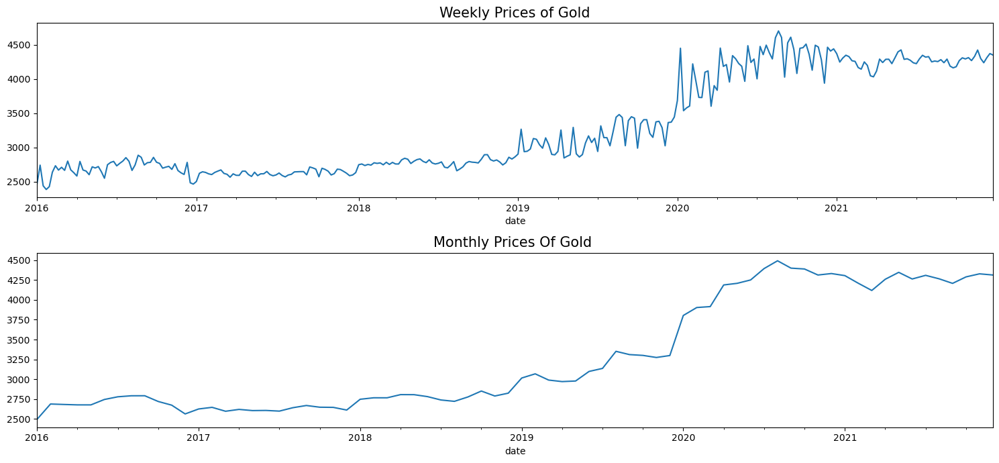

In [37]:
#plotting for comparison of weekly and monthly price 
plt.subplot(211)
plt.title("Weekly Prices of Gold",fontsize =15)
df_week.price.plot(figsize = (15,7))
plt.subplot(212)
plt.title("Monthly Prices Of Gold ",fontsize =15)
df_month.price.plot(figsize = (15,7))
plt.tight_layout()


## Observation

- We observe that in our weekly report we observe that the average price of gold from 2016 has been with minor fluctuations, and no change in trend or seasonality but as we move ahead from 2019 we see sudden upward trend in the weekly prices of gold from 2019 and variations in the seasonality also



- We observe in our monthly prices report we observe that from 2016 - 2019  every month the prices of gold have captured no major trend and minor seasonality, while from the year 2019 the price of gold has captured a spike with an upward trend in the prices and every month the price has been increasing. 

In [38]:
df_gold1.head()

,date,price,year,month,week,quarter,day_of_week
0,2016-01-01,2252.60,2016,1,53,1,Friday
1,2016-01-02,2454.50,2016,1,53,1,Saturday
2,2016-01-03,2708.10,2016,1,53,1,Sunday
3,2016-01-04,2577.80,2016,1,1,1,Monday
4,2016-01-05,2597.75,2016,1,1,1,Tuesday


In [39]:
#extracting daily percentage change in the price of gold 
df_gold1['daily_pct_change'] = df_gold1.price.pct_change()

In [40]:
df_gold1.head()

,date,price,year,month,week,quarter,day_of_week,daily_pct_change
0,2016-01-01,2252.60,2016,1,53,1,Friday,NaN
1,2016-01-02,2454.50,2016,1,53,1,Saturday,0.089630
2,2016-01-03,2708.10,2016,1,53,1,Sunday,0.103320
3,2016-01-04,2577.80,2016,1,1,1,Monday,-0.048115
4,2016-01-05,2597.75,2016,1,1,1,Tuesday,0.007739


In [41]:
df_gold1.describe().T

,count,mean,std,min,25%,50%,75%,max
price,2182.0,3284.450046,719.564434,2252.6,2697.02,2879.8,4147.325,4966.3
year,2182.0,2018.488084,1.704054,2016.0,2017.0,2018.0,2020.0,2021.0
month,2182.0,6.496792,3.437626,1.0,4.0,7.0,9.0,12.0
week,2182.0,26.483501,15.01054,1.0,13.25,26.0,39.0,53.0
quarter,2182.0,2.501375,1.115416,1.0,2.0,3.0,3.0,4.0
daily_pct_change,2181.0,0.000805,0.031395,-0.249826,-0.005752,0.0,0.006973,0.170527


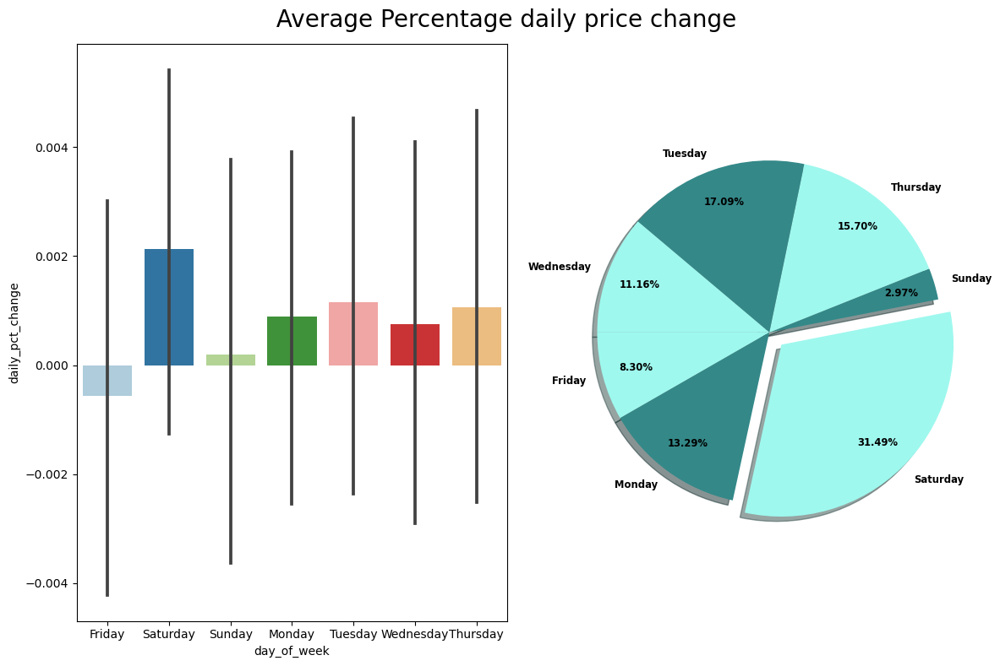

In [42]:
#plotting the percentage difference of prices between the days 
fig,ax = plt.subplots(ncols=2,figsize=(12,8))
fig.suptitle(" Average Percentage daily price change",fontsize = 20)
sn.barplot(ax =ax[0],data = df_gold1,x='day_of_week',y = 'daily_pct_change',palette='Paired')
plt.pie(np.abs(df_gold1.groupby('day_of_week')['daily_pct_change'].mean()),
      labels=['Friday','Monday','Saturday','Sunday','Thursday','Tuesday','Wednesday'], autopct= '%.2f%%',shadow=True,
      colors = ['#9EF8EE','#348888'],startangle = 180,pctdistance = 0.80,explode= [0.0,0.0,0.1,0.0,0.0,0.0,0.0],
      textprops={'size':'small',
                 'fontweight':'bold'})
plt.tight_layout()



## Observation 

- We observe that when we check for percentage difference daywise, we observe that the highest percentage change in prices on saturday is the highest, while the percentage change is least on friday, almost negative , we also observe that from monday to Thursday the percentage change in price is very minimal.

In [43]:
#extracting weekly percentage change in price of gold 
df_week['week_pct_change'] = df_week.price.pct_change()

In [44]:
df_week.head()

,price,year,week_pct_change
date,,,
2016-01-03,2471.733333,2016.0,NaN
2016-01-10,2740.778571,2016.0,0.108849
2016-01-17,2439.657143,2016.0,-0.109867
2016-01-24,2385.528571,2016.0,-0.022187
2016-01-31,2427.692857,2016.0,0.017675


In [45]:
#extracting the descriptive statistics for gold prices weekly 
df_week.describe().T

,count,mean,std,min,25%,50%,75%,max
price,313.0,3285.398646,712.786357,2385.528571,2702.014286,2871.071429,4179.585714,4701.800000
year,313.0,2018.489274,1.709787,2016.000000,2017.000000,2018.000000,2020.000000,2021.000000
week_pct_change,312.0,0.002910,0.047136,-0.205077,-0.016053,0.000113,0.014326,0.207164


In [46]:
#extracting the monthly pecentage gold prices
df_month['month_pct_change'] = df_month.price.pct_change()


In [47]:
df_month.head()

,price,year,month_pct_change
date,,,
2016-01-31,2495.832258,2016.0,NaN
2016-02-29,2688.703448,2016.0,0.077277
2016-03-31,2682.854839,2016.0,-0.002175
2016-04-30,2677.790000,2016.0,-0.001888
2016-05-31,2677.650000,2016.0,-0.000052


In [48]:
#extracting for monthly descriptive staticstics for monthly gold prices
df_month.describe().T

,count,mean,std,min,25%,50%,75%,max
price,72.0,3288.757806,708.219953,2495.832258,2687.241296,2911.443387,4207.630000,4491.829032
year,72.0,2018.500000,1.719810,2016.000000,2017.000000,2018.500000,2020.000000,2021.000000
month_pct_change,71.0,0.008131,0.029067,-0.041356,-0.007981,0.002506,0.016956,0.152813


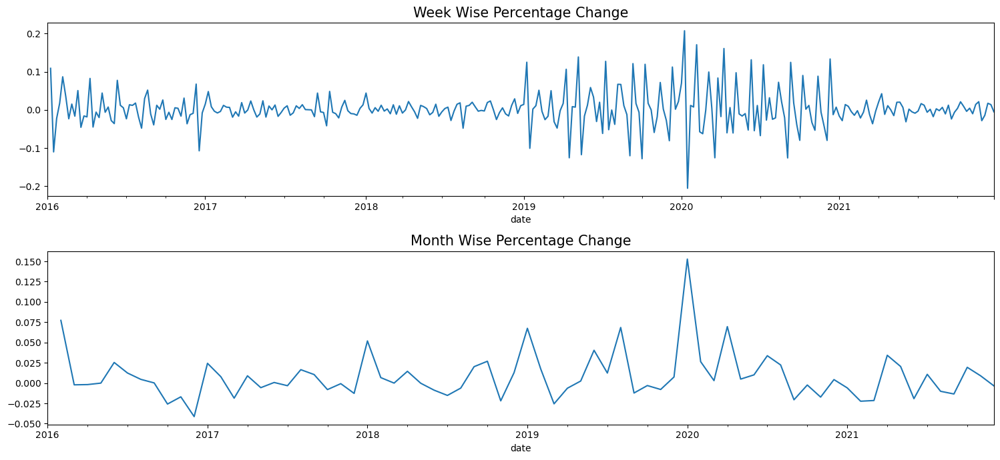

In [49]:
#plotting for monthly and weekly change in percentage price of gold 
plt.subplot(211)
df_week.week_pct_change.plot(figsize = (15,7))
plt.title("Week Wise Percentage Change",fontsize = 15)
plt.subplot(212)
plt.title("Month Wise Percentage Change",fontsize = 15)
df_month.month_pct_change.plot(figsize = (15,7))
plt.tight_layout()

## Observation
 - We observe that the percentage change in weekly price of gold has lower fluctuations from 2016 - 2019 but from the year 2019 every week the percentage change in prices of gold have seen higher fluctuations, we also see that in the year 2020 few weeks the prices had dipped down.
 
 
 
 - We observe that the percentage in monthly price of gold has seen lower fluctuations till the year 2019, but from the year 2019 the change percentage of prices of gold have gone higher with year 2020 where the price of gold have been highest.

In [50]:
#extracting Quaterly prices of  gold 
df_quarter = pd.DataFrame(df_gold.set_index('date').resample('Q').mean())

In [51]:
df_quarter.head()

,price,year
date,,
2016-03-31,2621.007692,2016.0
2016-06-30,2700.096154,2016.0
2016-09-30,2788.126630,2016.0
2016-12-31,2652.572645,2016.0
2017-03-31,2622.654630,2017.0


In [52]:
#extracting percentage change in prices 
df_quarter["quarter_pct_change"] = df_quarter.price.pct_change()

In [53]:
df_quarter.head()

,price,year,quarter_pct_change
date,,,
2016-03-31,2621.007692,2016.0,NaN
2016-06-30,2700.096154,2016.0,0.030175
2016-09-30,2788.126630,2016.0,0.032603
2016-12-31,2652.572645,2016.0,-0.048618
2017-03-31,2622.654630,2017.0,-0.011279


In [54]:
#extracting descriptive statistics of gold prices quarterly 
df_quarter.describe().T

,count,mean,std,min,25%,50%,75%,max
price,24.0,3288.551880,717.258928,2611.393407,2688.215277,2919.069332,4211.953901,4428.619565
year,24.0,2018.500000,1.744557,2016.000000,2017.000000,2018.500000,2020.000000,2021.000000
quarter_pct_change,23.0,0.022905,0.048395,-0.048618,-0.005546,0.011345,0.039983,0.176724


In [55]:
df_month.head()

,price,year,month_pct_change
date,,,
2016-01-31,2495.832258,2016.0,NaN
2016-02-29,2688.703448,2016.0,0.077277
2016-03-31,2682.854839,2016.0,-0.002175
2016-04-30,2677.790000,2016.0,-0.001888
2016-05-31,2677.650000,2016.0,-0.000052


In [56]:
#extracting the month name from the data
df_month = df_month.reset_index()
df_month['month'] = df_month.date.dt.strftime("%b")
df_month.head()

,date,price,year,month_pct_change,month
0,2016-01-31,2495.832258,2016.0,NaN,Jan
1,2016-02-29,2688.703448,2016.0,0.077277,Feb
2,2016-03-31,2682.854839,2016.0,-0.002175,Mar
3,2016-04-30,2677.790000,2016.0,-0.001888,Apr
4,2016-05-31,2677.650000,2016.0,-0.000052,May


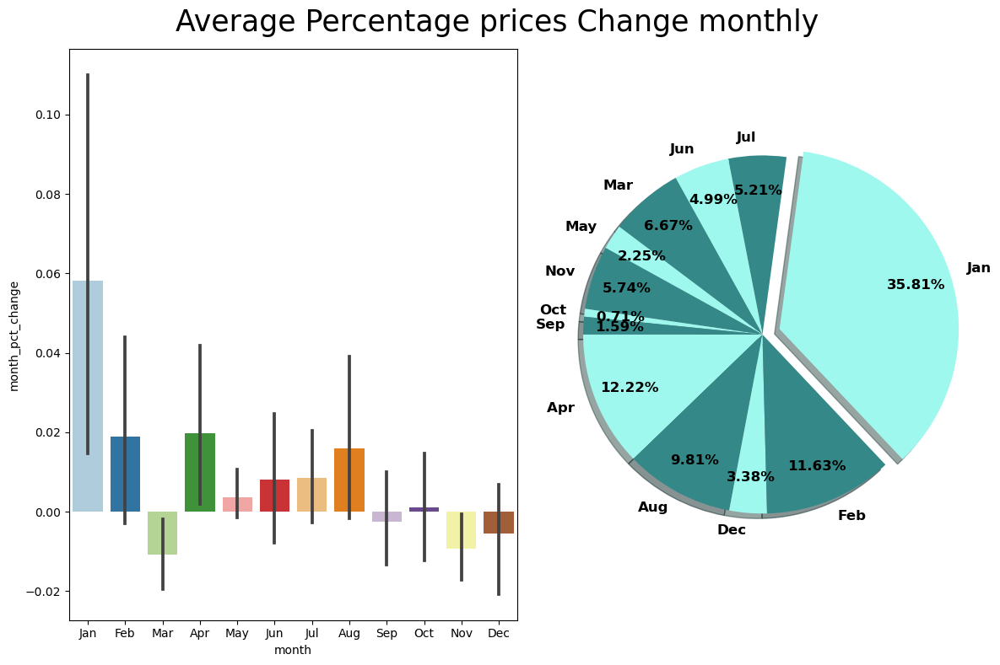

In [57]:
# average Monthly price change percentage wise for gold
fig,ax = plt.subplots(ncols=2,figsize=(12,8))
fig.suptitle("Average Percentage prices Change monthly ",fontsize = 25)
sn.barplot(ax = ax [0],x = 'month',y = 'month_pct_change',data = df_month,palette = 'Paired')
plt.pie(np.abs(df_month.groupby('month')['month_pct_change'].mean()),
      labels=['Apr ','Aug','Dec','Feb','Jan','Jul','Jun','Mar','May','Nov','Oct','Sep'], autopct= '%.2f%%',shadow=True,
      colors = ['#9EF8EE','#348888'],startangle = 180,pctdistance = 0.80,explode= [0.0,0.0,0.0,0.0,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
      textprops={'size':'large',
                 'fontweight':'bold'})
plt.tight_layout()



## Observation 

- In the above plot we observe that the average percentage of prices from 2016 to 2021 in all the months the  highest is from january constituting 35% of the plot while the lowest percentage change in prices are in september and october constituting 0.71 and 1.59 percentage respectively.


- We also observe the average percentage of prices have dropped down in the month of march that is almost 6.67% cumulative of all the years

In [58]:
#Extracting the quarter from the data
df_quarter = df_quarter.reset_index()
df_quarter['quarter'] = df_quarter['date'].dt.quarter
df_quarter.head()

,date,price,year,quarter_pct_change,quarter
0,2016-03-31,2621.007692,2016.0,NaN,1
1,2016-06-30,2700.096154,2016.0,0.030175,2
2,2016-09-30,2788.126630,2016.0,0.032603,3
3,2016-12-31,2652.572645,2016.0,-0.048618,4
4,2017-03-31,2622.654630,2017.0,-0.011279,1


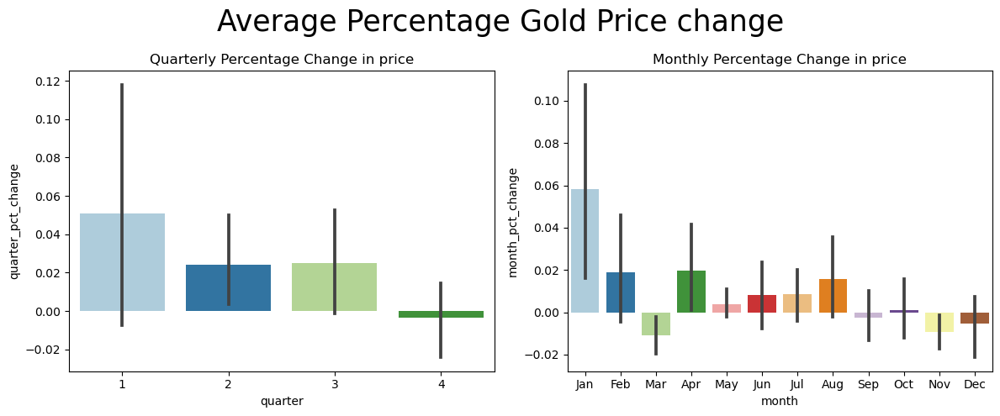

In [59]:
#plotting for quaterly pct change in prices
fig,ax = plt.subplots(ncols=2,figsize=(12,5))
fig.suptitle("Average Percentage Gold Price change",fontsize = 25)
sn.barplot(ax = ax[0],x = 'quarter',y = 'quarter_pct_change',data = df_quarter,palette = 'Paired')
sn.barplot(ax = ax [1],x = 'month',y = 'month_pct_change',data = df_month,palette = 'Paired')
ax[0].set_title("Quarterly Percentage Change in price",fontsize=12)
ax[1].set_title("Monthly Percentage Change in price",fontsize = 12)    
plt.tight_layout()


## Observations 
 - When we compare the percentage price change of gold with quarterly and monthly we observe that the change in percentage of prices have mostly been in the first quarters, while the second and third quarter did not have much rise in percentage of gold prices. and minor drop of every year fourth quarter
 
 
 
 - if we observe the monthly we see that from september to december,including march, the percentage of prices have been dropping over the years and its very evidently visible that in the last quarter of every year the gold prices have been dropping.

In [60]:
#Extracting  the maximum yearly price from the data 
df_annual = pd.DataFrame(df_gold2.set_index('date').resample('A').max())

In [61]:
df_annual.head()

,price
date,
2016-12-31,2956.6
2017-12-31,2763.4
2018-12-31,2906.0
2019-12-31,3590.4
2020-12-31,4966.3


In [62]:
#extracting the percentage change in prices yearly 
df_annual['max_pct_change'] = df_annual.price.pct_change()

In [63]:
df_annual.head()

,price,max_pct_change
date,,
2016-12-31,2956.6,NaN
2017-12-31,2763.4,-0.065345
2018-12-31,2906.0,0.051603
2019-12-31,3590.4,0.235513
2020-12-31,4966.3,0.383216


In [64]:
#Extracting the year from the data
df_annual = df_annual.reset_index()
df_annual['year'] = df_annual['date'].dt.year
df_annual.head()

,date,price,max_pct_change,year
0,2016-12-31,2956.6,NaN,2016
1,2017-12-31,2763.4,-0.065345,2017
2,2018-12-31,2906.0,0.051603,2018
3,2019-12-31,3590.4,0.235513,2019
4,2020-12-31,4966.3,0.383216,2020


In [65]:
#extracting the descriptive statistics for annual prices
df_annual.describe().T

,count,mean,std,min,25%,50%,75%,max
price,6.0,3627.166667,940.098601,2763.400000,2918.650000,3273.500000,4332.825000,4966.300000
max_pct_change,5.0,0.105453,0.199808,-0.077724,-0.065345,0.051603,0.235513,0.383216
year,6.0,2018.500000,1.870829,2016.000000,2017.250000,2018.500000,2019.750000,2021.000000


Text(0.5, 1.0, ' Maximum Price for the year ')

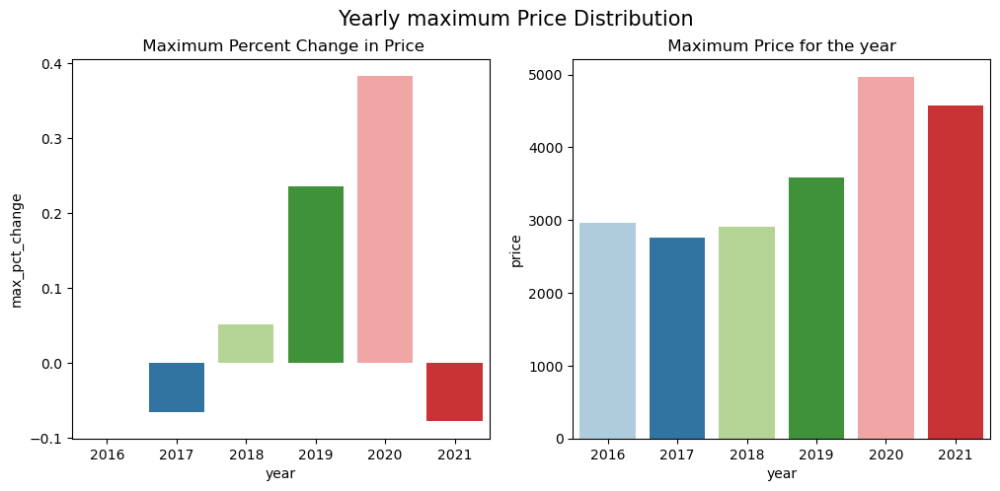

In [66]:
###### plotting for yearly and monthly percentage change in price
fig,ax = plt.subplots(ncols=2,figsize = (12,5))
fig.suptitle("Yearly maximum Price Distribution",fontsize = 15)
sn.barplot(ax = ax [0],x = 'year',y = 'max_pct_change',data = df_annual,palette = 'Paired')
sn.barplot(ax = ax [1],x = 'year',y = 'price',data = df_annual,palette = 'Paired')
ax[0].set_title(" Maximum Percent Change in Price")
ax[1].set_title(" Maximum Price for the year ")


## Observation
 
 - We observe that from the year in the year 2017 the percentage of rise in prices dipped down around -0.06% and from the  year 2018 till 2021 we also observe the percentage of rise in price from -0.06  to 0.2 from the year 2018 to 2020.
 
 
 - In the year 2020 since the pandemic was at peak the demand slow down and the supply was high, with complete shutdown all over the world, we observe that the maximum price of gold drastically dropped down.
 
 
 - We also observe the maximum price of the year from the year 2016  to 2017 dipping down, but from the year 2018 till 2020 there was huge growth, while back in 2021 the price drastically fell down, we can conclude that the gold market over the six years period has been very volatile and in future the prices may see this kind of volatility.

## Model Building

In [67]:
df_gold4 = df_gold2.copy()
df_gold4.set_index('date',inplace=True)

In [68]:
df_gold4.head()

,price
date,
2016-01-01,2252.60
2016-01-02,2454.50
2016-01-03,2708.10
2016-01-04,2577.80
2016-01-05,2597.75


In [69]:
#splitting our data in train and test data with test data leaving with 30 days timeseries
size = 2092
train = df_gold4[:size]
test = df_gold4[size:]
print(train.shape,test.shape)

(2092, 1) (90, 1)


In [70]:
#train data
train.head()

,price
date,
2016-01-01,2252.60
2016-01-02,2454.50
2016-01-03,2708.10
2016-01-04,2577.80
2016-01-05,2597.75


In [71]:
#test data
test.head()

,price
date,
2021-09-23,4142.4
2021-09-24,4138.7
2021-09-25,4147.6
2021-09-26,4147.6
2021-09-27,4145.2


<Axes: xlabel='date'>

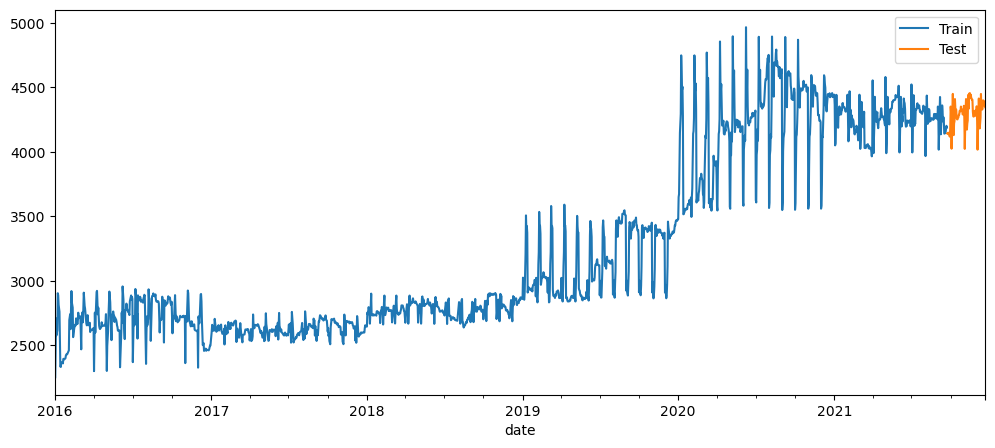

In [72]:
#plotting our train and test data
train.price.plot(figsize = (12,5),legend=True,label = 'Train')
test.price.plot(figsize = (12,5),legend=True,label = 'Test')

In [73]:
#defining mean absolute percentaage error
def MAPE(pred,org):
    temp = np.abs((pred-org)/org)*100
    return np.mean(temp)

## Data driven models

 ### Simple Exponential Method

In [74]:
#fitting our simple exponential model
ses_model = SimpleExpSmoothing(train['price']).fit(optimized=True)
test_pred_ses = ses_model.forecast(90)
train_pred_ses = ses_model.fittedvalues
test_rmse_ses = sqrt(mean_squared_error(test_pred_ses,test.price))
train_rmse_ses = sqrt(mean_squared_error(train_pred_ses,train))
mape_ses = MAPE(test_pred_ses,test.price)
print('Simple Exponential Smoothing Method Evalution',"\n",\
     'Mean absolute percentage error = {}'.format(mape_ses),"\n",\
     'Train Root Mean Squared error = {}'.format(train_rmse_ses),"\n",
     'Test root mean squared error = {}'.format(test_rmse_ses))

Simple Exponential Smoothing Method Evalution 
 Mean absolute percentage error = 2.9426721111835774 
 Train Root Mean Squared error = 114.82329688324523 
 Test root mean squared error = 145.7741192259047


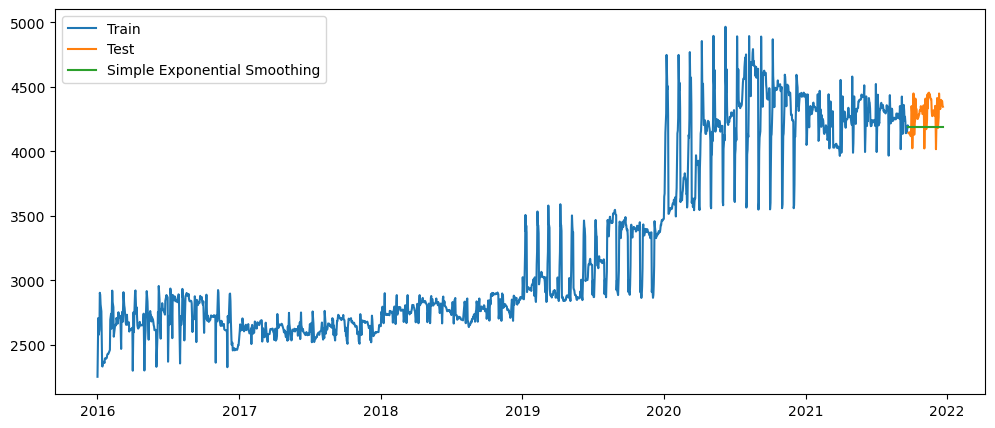

In [75]:
#plotting for simple exponential method
plt.figure(figsize = (12,5))
plt.plot(train,label = 'Train')
plt.plot(test,label = 'Test')
plt.plot(test_pred_ses,label = 'Simple Exponential Smoothing')
plt.legend(loc = 'best')
plt.show()

### Observation 

- We observe no seasonality or trend is captured by the model 

- We also observe that recent observation are considered than the older observations 

### Holt method (Double exponential method)

In [76]:
#fitting our holt Double exponential model
dexp_model = Holt(train['price']).fit(optimized=True)
test_pred_exp = dexp_model.forecast(90)
train_pred_exp = dexp_model.fittedvalues
test_rmse_exp = sqrt(mean_squared_error(test_pred_exp,test.price))
train_rmse_exp = sqrt(mean_squared_error(train_pred_exp,train))
mape_exp = MAPE(test_pred_exp,test.price)
print('Simple Exponential Smoothing Method Evalution',"\n",\
     'Mean absolute percentage error = {}'.format(mape_exp),"\n",\
     'Train Root Mean Squared error = {}'.format(train_rmse_exp),"\n",
     'Test root mean squared error = {}'.format(test_rmse_exp))

Simple Exponential Smoothing Method Evalution 
 Mean absolute percentage error = 4.481962004227474 
 Train Root Mean Squared error = 116.07677226817688 
 Test root mean squared error = 218.15134056964436


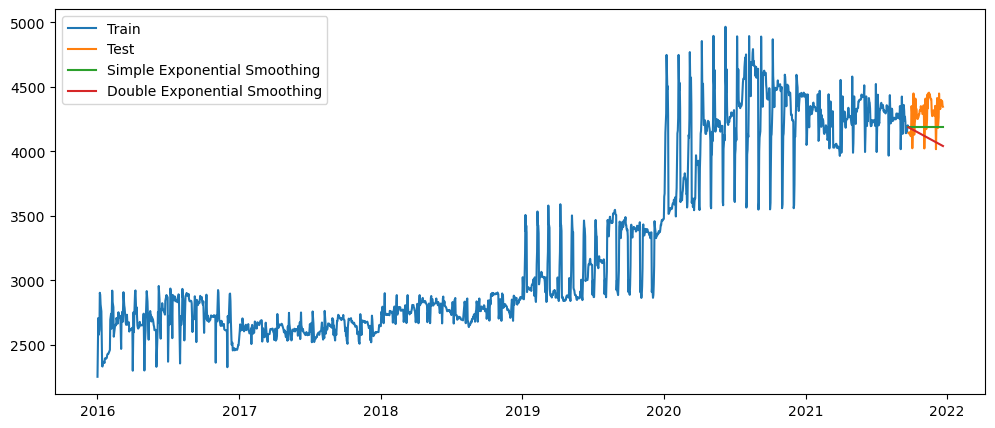

In [77]:
#plotting for comparison of models
plt.figure(figsize = (12,5))
plt.plot(train,label = 'Train')
plt.plot(test,label = 'Test')
plt.plot(test_pred_ses,label = 'Simple Exponential Smoothing')
plt.plot(test_pred_exp,label = 'Double Exponential Smoothing')
plt.legend(loc = 'best')
plt.show()

### Observation 
 
- Double Exponential captures both the level and trend of the data and we see the trend is downward 

- the  model does not capture seasonality
  
  

### Holts winter exponential smoothing with additive seasonality and trend (Triple Exponential)

In [78]:
#fitting our holt exponential model
texp_add_model = ExponentialSmoothing(train,seasonal='add',trend = 'add',seasonal_periods=30).fit(optimized=True)
test_pred_add_texp = texp_add_model.forecast(90)
train_pred_add_texp = texp_add_model.fittedvalues
test_rmse_add_texp = sqrt(mean_squared_error(test_pred_add_texp,test.price))
train_rmse_add_texp = sqrt(mean_squared_error(train_pred_add_texp,train))
mape_add_texp = MAPE(test_pred_add_texp,test.price)
print('Triple Exponential with Additive Trend and Seasonality Method Evaluation',"\n",\
     'Mean absolute percentage error = {}'.format(mape_add_texp),"\n",\
     'Train Root Mean Squared error = {}'.format(train_rmse_add_texp),"\n",
     'Test root mean squared error = {}'.format(test_rmse_add_texp))

Triple Exponential with Additive Trend and Seasonality Method Evaluation 
 Mean absolute percentage error = 2.5218099406483074 
 Train Root Mean Squared error = 123.2693766423209 
 Test root mean squared error = 127.20733062704957


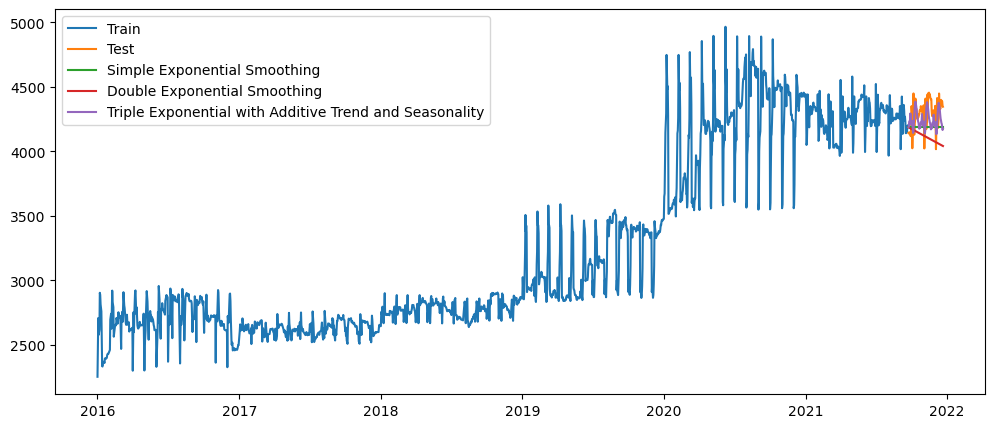

In [79]:
#plotting for comparison of models
plt.figure(figsize = (12,5))
plt.plot(train,label = 'Train')
plt.plot(test,label = 'Test')
plt.plot(test_pred_ses,label = 'Simple Exponential Smoothing')
plt.plot(test_pred_exp,label = 'Double Exponential Smoothing')
plt.plot(test_pred_add_texp,label = 'Triple Exponential with Additive Trend and Seasonality')
plt.legend(loc = 'best')
plt.show()

### Observation

- Triple exponential method captures trend, we can see the trend moving downwards.

- it also captures seasonality, and we can see its additive seasonality 

- we also observe that the forecast values are lower than the actual values

## Holts winter exponential smoothing with multiplicative seasonality and additive trend (Triple Exponential)

In [80]:
#fitting our holt exponential model
texp_mul_add_model = ExponentialSmoothing(train,seasonal='mul',trend = 'add',seasonal_periods=30).fit(optimized=True)
test_pred_mul_add_texp = texp_mul_add_model.forecast(90)
train_pred_mul_add_texp = texp_mul_add_model.fittedvalues
test_rmse_mul_add_texp = sqrt(mean_squared_error(test_pred_mul_add_texp,test.price))
train_rmse_mul_add_texp = sqrt(mean_squared_error(train_pred_mul_add_texp,train))
mape_mul_add_texp = MAPE(test_pred_mul_add_texp,test.price)
print('Triple Exponential with Multiplicative seasonality and additive trend Method Evaluation',"\n",\
     'Mean absolute percentage error = {}'.format(mape_mul_add_texp),"\n",\
     'Train Root Mean Squared error = {}'.format(train_rmse_mul_add_texp),"\n",
     'Test root mean squared error = {}'.format(test_rmse_mul_add_texp))

Triple Exponential with Multiplicative seasonality and additive trend Method Evaluation 
 Mean absolute percentage error = 3.0879462842367857 
 Train Root Mean Squared error = 126.68237591795977 
 Test root mean squared error = 160.65097969264284


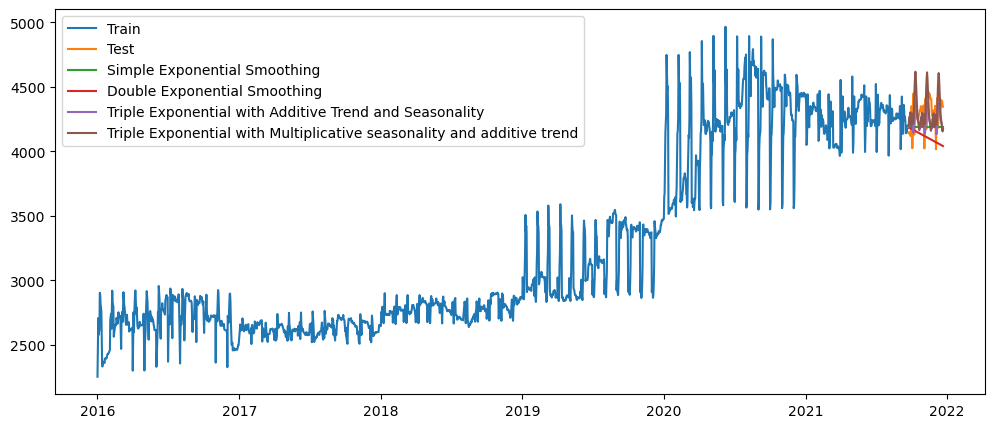

In [81]:
#plotting for comparison of models
plt.figure(figsize = (12,5))
plt.plot(train,label = 'Train')
plt.plot(test,label = 'Test')
plt.plot(test_pred_ses,label = 'Simple Exponential Smoothing')
plt.plot(test_pred_exp,label = 'Double Exponential Smoothing')
plt.plot(test_pred_add_texp,label = 'Triple Exponential with Additive Trend and Seasonality')
plt.plot(test_pred_mul_add_texp,label = 'Triple Exponential with Multiplicative seasonality and additive trend')
plt.legend(loc = 'best')
plt.show()

### Observation
 
  - We capture,level,trend and seasonality together and we see that the errors have increased

## Holts winter exponential smoothing with Additive seasonality and multiplicative trend (Triple Exponential)

In [82]:
#fitting our holt exponential model
texp_add_mul_model = ExponentialSmoothing(train,seasonal='add',trend = 'mul',seasonal_periods=30).fit(optimized=True,smoothing_level=0.1,smoothing_slope = 0.5)
test_pred_add_mul_texp = texp_add_mul_model.forecast(90)
train_pred_add_mul_texp = texp_add_mul_model.fittedvalues
test_rmse_add_mul_texp = sqrt(mean_squared_error(test_pred_add_mul_texp,test.price))
train_rmse_add_mul_texp = sqrt(mean_squared_error(train_pred_add_mul_texp,train))
mape_add_mul_texp = MAPE(test_pred_add_mul_texp,test.price)
print('Triple Exponential with Additive seasonality and multiplicative trend Method Evaluation',"\n",\
     'Mean absolute percentage error = {}'.format(mape_add_mul_texp),"\n",\
     'Train Root Mean Squared error = {}'.format(train_rmse_add_mul_texp),"\n",
     'Test root mean squared error = {}'.format(test_rmse_add_mul_texp))

Triple Exponential with Additive seasonality and multiplicative trend Method Evaluation 
 Mean absolute percentage error = 14.473640073443896 
 Train Root Mean Squared error = 283.1087457266656 
 Test root mean squared error = 766.4435320477007


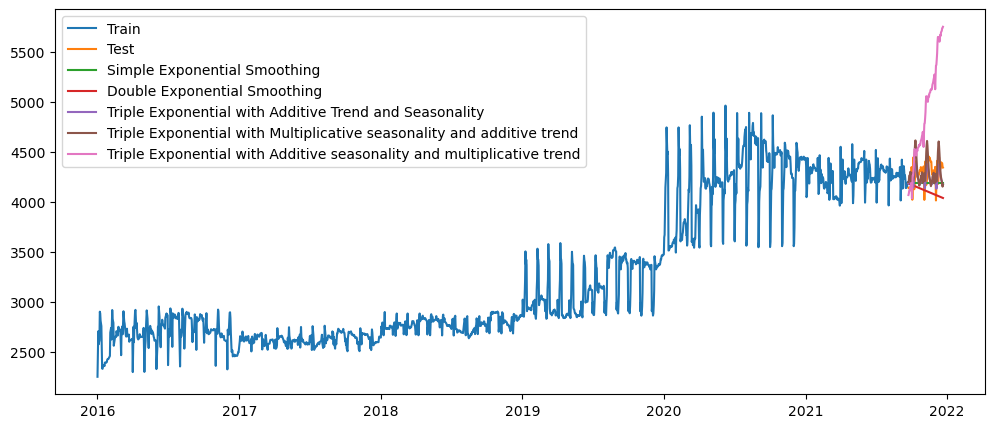

In [83]:
#plotting for comparison of models
plt.figure(figsize = (12,5))
plt.plot(train,label = 'Train')
plt.plot(test,label = 'Test')
plt.plot(test_pred_ses,label = 'Simple Exponential Smoothing')
plt.plot(test_pred_exp,label = 'Double Exponential Smoothing')
plt.plot(test_pred_add_texp,label = 'Triple Exponential with Additive Trend and Seasonality')
plt.plot(test_pred_mul_add_texp,label = 'Triple Exponential with Multiplicative seasonality and additive trend')
plt.plot(test_pred_add_mul_texp,label = 'Triple Exponential with Additive seasonality and multiplicative trend')
plt.legend(loc = 'best')
plt.show()

### Observation

- It captures the trend which we can see going upward
- We also observe that the  forecast values are rising compare too actual, the model is not able to capture 

## Holts winter exponential smoothing with multiplicative seasonality and multiplicative trend (Triple Exponential)

In [84]:
#fitting our holt exponential model
texp_mul_mul_model = ExponentialSmoothing(train,seasonal='mul',trend = 'mul',seasonal_periods=30).fit(optimized=True)
test_pred_mul_mul_texp = texp_mul_mul_model.forecast(90)
train_pred_mul_mul_texp = texp_mul_mul_model.fittedvalues
test_rmse_mul_mul_texp = sqrt(mean_squared_error(test_pred_mul_mul_texp,test.price))
train_rmse_mul_mul_texp = sqrt(mean_squared_error(train_pred_mul_mul_texp,train))
mape_mul_mul_texp = MAPE(test_pred_mul_mul_texp,test.price)
print('Holts winter exponential smoothing with multiplicative seasonality and multiplicative trend Method Evaluation',"\n",\
     'Mean absolute percentage error = {}'.format(mape_mul_mul_texp),"\n",\
     'Train Root Mean Squared error = {}'.format(train_rmse_mul_mul_texp),"\n",
     'Test root mean squared error = {}'.format(test_rmse_mul_mul_texp))

Holts winter exponential smoothing with multiplicative seasonality and multiplicative trend Method Evaluation 
 Mean absolute percentage error = 2.906569634644322 
 Train Root Mean Squared error = 130.05443363977128 
 Test root mean squared error = 150.95007735130716


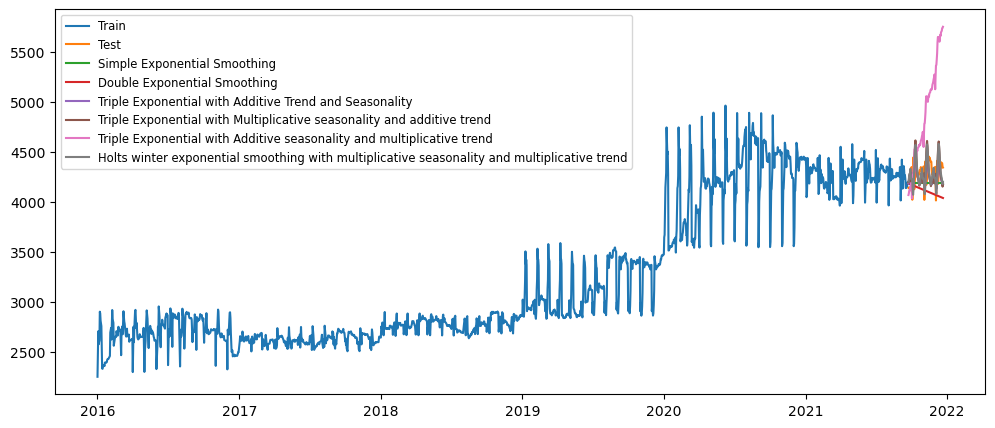

In [85]:
#plotting for comparison of models
plt.figure(figsize = (12,5))
plt.plot(train,label = 'Train')
plt.plot(test,label = 'Test')
plt.plot(test_pred_ses,label = 'Simple Exponential Smoothing')
plt.plot(test_pred_exp,label = 'Double Exponential Smoothing')
plt.plot(test_pred_add_texp,label = 'Triple Exponential with Additive Trend and Seasonality')
plt.plot(test_pred_mul_add_texp,label = 'Triple Exponential with Multiplicative seasonality and additive trend')
plt.plot(test_pred_add_mul_texp,label = 'Triple Exponential with Additive seasonality and multiplicative trend')
plt.plot(test_pred_mul_mul_texp,label = 'Holts winter exponential smoothing with multiplicative seasonality and multiplicative trend')
plt.legend(loc = 'best',fontsize = 'small')
plt.show()

### Observation

- the model captures seasonality  and trend in the data 

-  we also observe the errors have dropped in the model 

In [86]:
#comparing the results for all models 

evaluation = {"Models":pd.Series(["Simple_Exp","Double_Exp","Triple_add_Exp","Triple_mul_add_Exp","Triple_add_mul_Exp"\
                                 ,"triple_mul_mul_Exp"]),\
             "Train_RMSE":pd.Series([train_rmse_ses,train_rmse_exp,train_rmse_add_texp,train_rmse_mul_add_texp,train_rmse_add_mul_texp,train_rmse_mul_mul_texp]),\
             "Test_Mape(%)":pd.Series([mape_ses,mape_exp,mape_add_texp,mape_mul_add_texp,mape_add_mul_texp,mape_mul_mul_texp]),\
             "Test_RMSE_Values":pd.Series([test_rmse_ses,test_rmse_exp,test_rmse_add_texp,test_rmse_mul_add_texp,test_rmse_add_mul_texp,test_rmse_mul_mul_texp])}
table_eval = pd.DataFrame(evaluation)
table_eval.sort_values(['Test_Mape(%)'],inplace=True,ignore_index=True)
table_eval

,Models,Train_RMSE,Test_Mape(%),Test_RMSE_Values
0,Triple_add_Exp,123.269377,2.521810,127.207331
1,triple_mul_mul_Exp,130.054434,2.906570,150.950077
2,Simple_Exp,114.823297,2.942672,145.774119
3,Triple_mul_add_Exp,126.682376,3.087946,160.650980
4,Double_Exp,116.076772,4.481962,218.151341
5,Triple_add_mul_Exp,283.108746,14.473640,766.443532


In [87]:
#copying our model conclusion for analysis
model_conclusion = table_eval.copy()

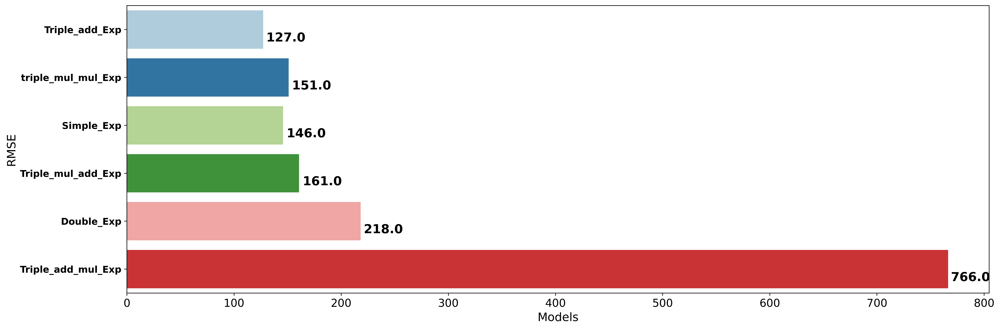

In [88]:
## Visualizing Models performance
f,ax = plt.subplots(1,1,figsize = (18,6),dpi = 500)
sn.barplot(x = 'Test_RMSE_Values',y = 'Models',data = table_eval,ax = ax,palette='Paired')
ax.set_xlabel('Models',size = 15)
ax.set_ylabel('RMSE',size = 15)
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=14)

for i,v in enumerate(np.round(table_eval.Test_RMSE_Values.values,0)):
    ax.text(v + 3,i + .25,str(v),
           color = 'black',fontweight = 'bold', fontsize= 16)
plt.tight_layout()

After Application of data driven models we got lowest RMSE score with Triple exponential with Additive seasonality and trend for training and testing data.
 
 

## Autoregressive Integrated Moving Averages (ARIMA)

 - Test of Stationarity
 
 As we have the data for quarterly so our Window size will be  4

In [89]:
def test_stationarity(df_gold4):
    
    #determine rolling statistics
    movingaverage = df_gold4.rolling(window = 30).mean()
    movingstd = df_gold4.rolling(window = 30).std()
    
    #plot rolling statistics
    plt.figure(figsize=(12,5))
    orig = plt.plot(df_gold4,color = 'black',label = 'original')
    mean = plt.plot(movingaverage,color = 'green',label = 'rolling mean')
    plt.legend(loc = 'best')
    plt.title('Rolling Mean')
    plt.show(block = False)
    
    #perform dickey fuller test
    
    print('results of Dickey Fuller test :')
    df_test = adfuller(df_gold4['price'],autolag='AIC')
    df_output = pd.Series(df_test[0:4],index = ['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in df_test[4].items():
        df_output['critical value (%s)'%key]= value
    print(df_output)
    


Augmented Dicky Fuller Test
Null Hypothesis (H0): The series is not stationary

p-val > 0.05

Alternate Hypothesis (H1): The series is stationary

p-val <= 0.05

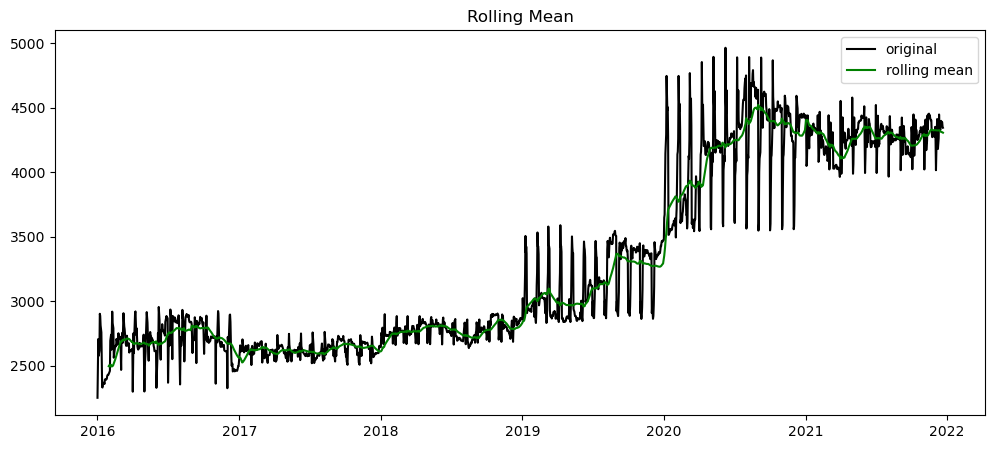

results of Dickey Fuller test :
Test Statistic                   -0.309904
p-value                           0.924090
#Lags Used                       26.000000
Number of Observations Used    2155.000000
critical value (1%)              -3.433388
critical value (5%)              -2.862882
critical value (10%)             -2.567484
dtype: float64


In [90]:
price = pd.DataFrame()
price['price'] = df_gold4[['price']]
test_stationarity(price)

In [91]:
def adf_test(series):
    result = adfuller(series.dropna())
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index = labels)
    if result[1]<= 0.05:
        print("reject the null hypothesis")
        print("Data is  stationary")
    else:
        print("failed to reject the null Hypothesis")
        print("Data is non-stationary")

In [92]:
#testing on our data without any transformations
adf_test(price.price)

failed to reject the null Hypothesis
Data is non-stationary


## Feature Scaling (Transformations)

- Square Root Transformation

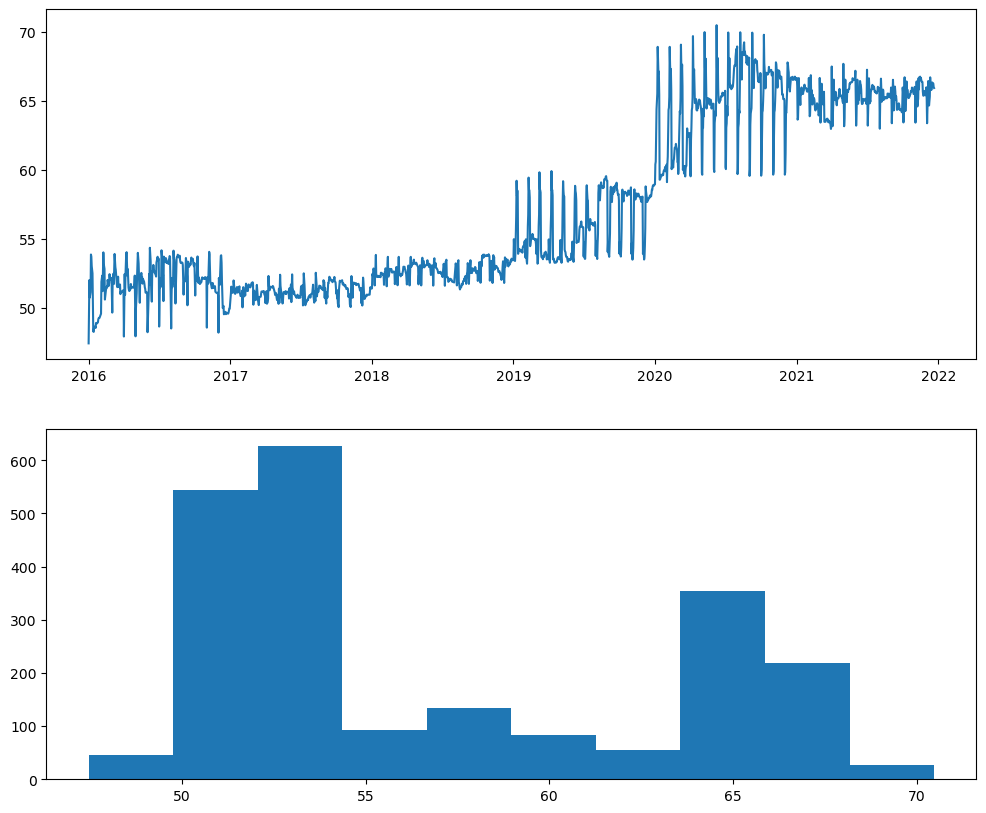

In [93]:
sqr_root = pd.DataFrame()
sqr_root = df_gold4[['price']]
sqr_root['price'] = np.sqrt(sqr_root.price)

# line chart
fig=plt.figure(figsize=(12,10))
plt.subplot(211)
plt.plot(sqr_root['price'])
#Histogram
plt.subplot(212)
plt.hist(sqr_root['price'])
plt.show()

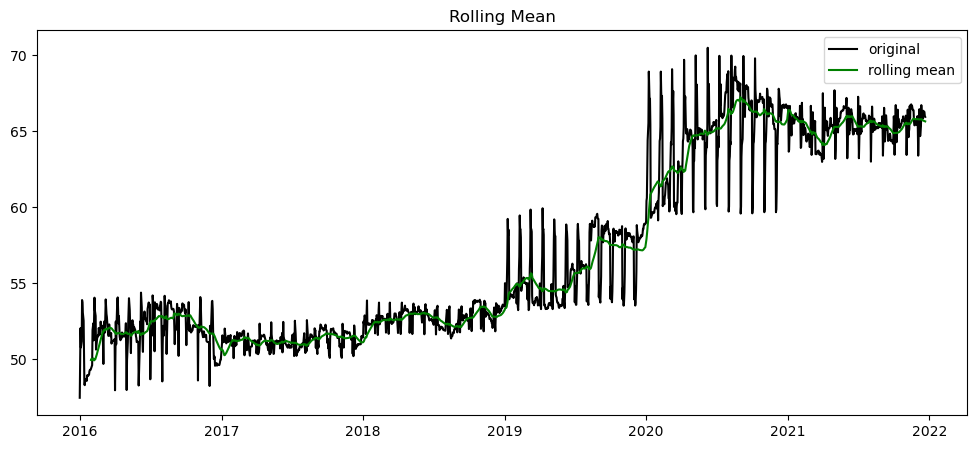

results of Dickey Fuller test :
Test Statistic                   -0.372419
p-value                           0.914603
#Lags Used                       26.000000
Number of Observations Used    2155.000000
critical value (1%)              -3.433388
critical value (5%)              -2.862882
critical value (10%)             -2.567484
dtype: float64


In [94]:
#test for stationary for square root 
test_stationarity(sqr_root)

In [95]:
# adfuller test for square root transformation
adf_test(sqr_root.price)

failed to reject the null Hypothesis
Data is non-stationary


-  Log Transformation

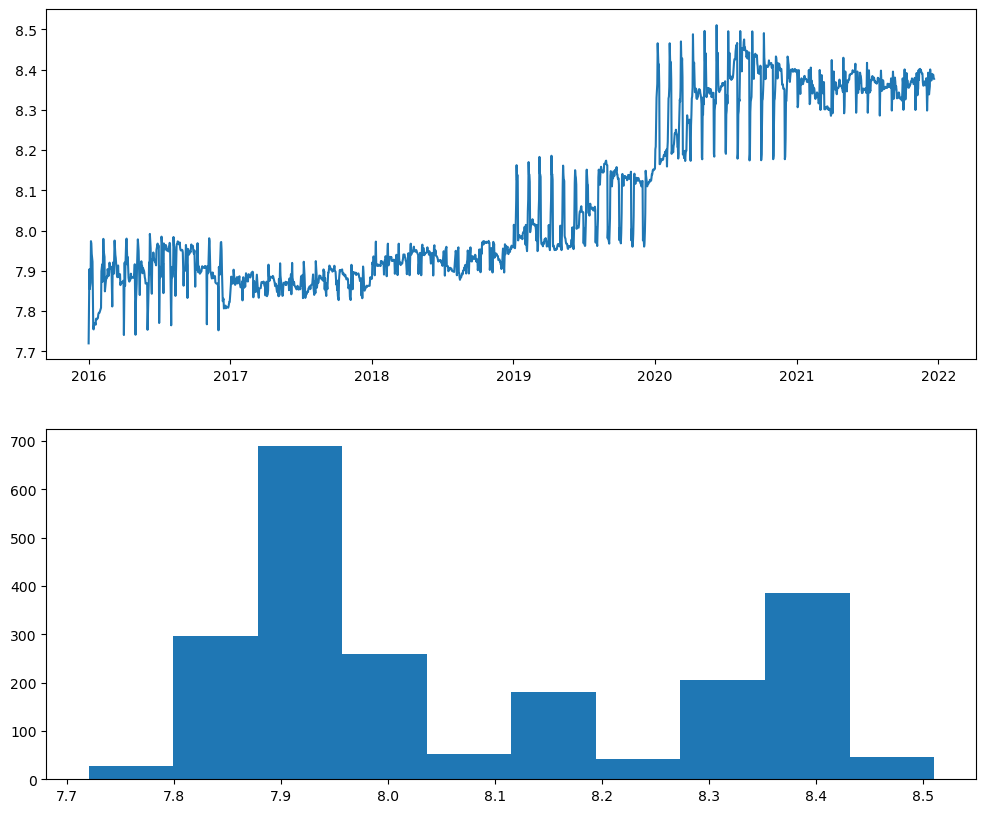

In [96]:
log = pd.DataFrame()
log = df_gold4[['price']]
log['price'] = np.log(log.price)

# line chart
fig=plt.figure(figsize=(12,10))
plt.subplot(211)
plt.plot(log['price'])
#Histogram
plt.subplot(212)
plt.hist(log['price'])
plt.show()


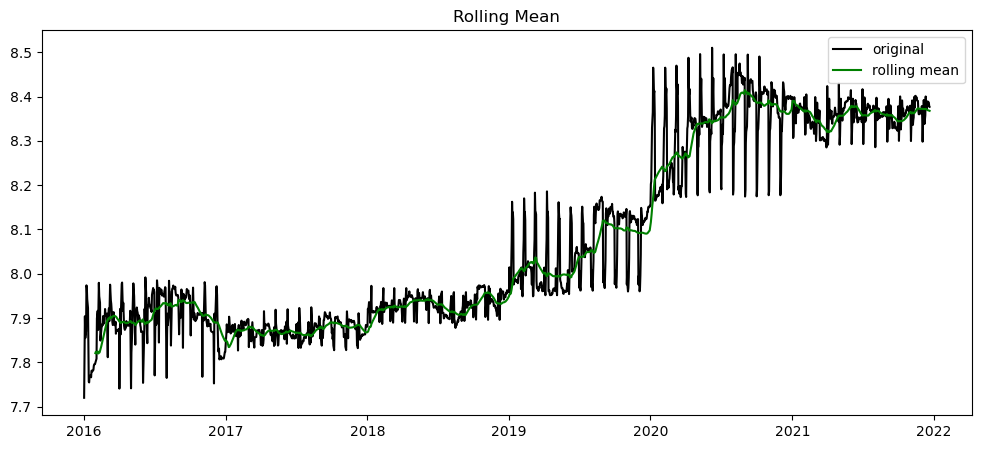

results of Dickey Fuller test :
Test Statistic                   -0.457214
p-value                           0.900099
#Lags Used                       26.000000
Number of Observations Used    2155.000000
critical value (1%)              -3.433388
critical value (5%)              -2.862882
critical value (10%)             -2.567484
dtype: float64


In [97]:
#test stationary for log transformation
test_stationarity(log)

In [98]:
#adfuller test for log transformation
adf_test(log.price)

failed to reject the null Hypothesis
Data is non-stationary


Since after the Two Transformations the data is still non stationary so we will be applying the Boxcox transfomration and performing the differencing on Boxcox transformation and convert the time series to stationary 

,price
date,
2016-01-01,7.719840
2016-01-02,7.805678
2016-01-03,7.904003
2016-01-04,7.854692
2016-01-05,7.862401


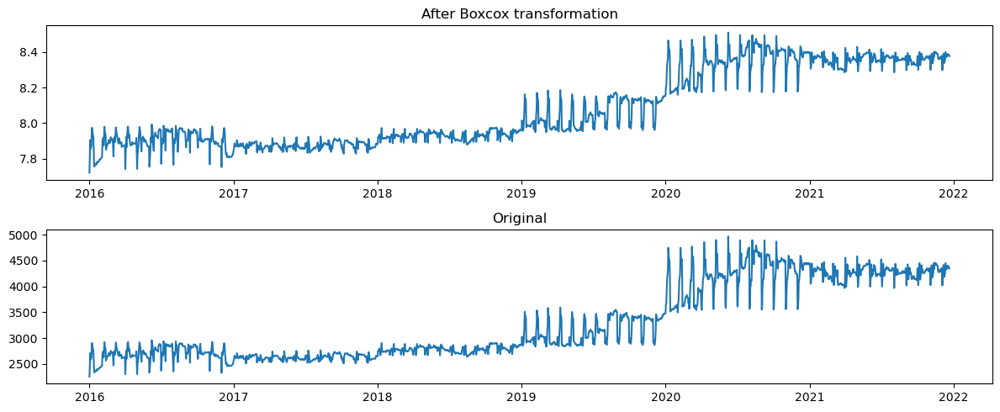

In [99]:
#converting to boxcox transformation
data_boxcox = pd.DataFrame()
data_boxcox['price'] = pd.Series(boxcox(df_gold4['price'],lmbda=0),df_gold4.index)
display(data_boxcox.head())
fig,ax = plt.subplots(2,figsize = (12,5))
ax[0].plot(data_boxcox)
ax[0].set_title("After Boxcox transformation")
ax[1].plot(df_gold4,label = "Original")
ax[1].set_title("Original")
plt.tight_layout()
plt.show()

## Observation

- We can observe that variance has almost become constant after the transformation, both in original and after transformation the variance is almost similiar.

- But we still see the series has an upward trend, this states that our mean is not yet constant hence we need to perform differencing to make the mean constant.

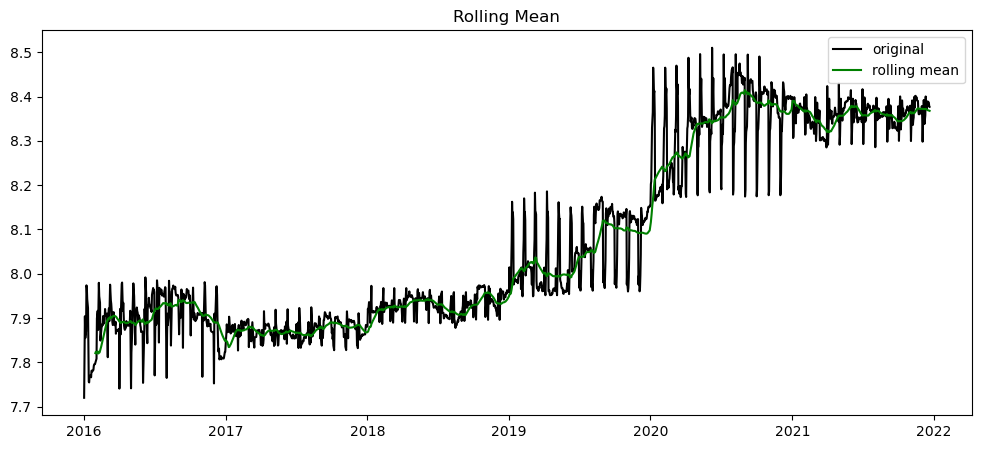

results of Dickey Fuller test :
Test Statistic                   -0.457214
p-value                           0.900099
#Lags Used                       26.000000
Number of Observations Used    2155.000000
critical value (1%)              -3.433388
critical value (5%)              -2.862882
critical value (10%)             -2.567484
dtype: float64


In [100]:
#test for stationary with boxcox 
test_stationarity(data_boxcox)

In [101]:
#test for stationary for boxcox
adf_test(data_boxcox.price)

failed to reject the null Hypothesis
Data is non-stationary


## Differencing  of the Box - Cox transformation

Differencing is performed by subtracting the previous observation from the current observation.

Differencing removes trend and seasonality in a Time series. When an entire cycle is used for differencing the other cycle, then the seasonality is removed.

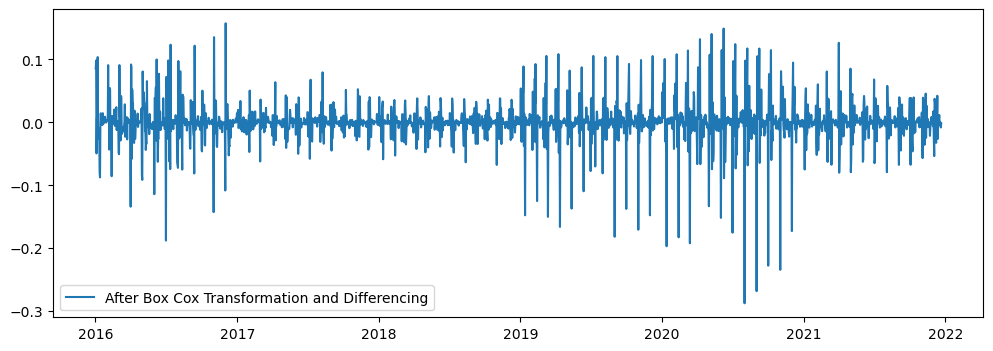

In [102]:
data_boxcox_diff = data_boxcox - data_boxcox.shift()
data_boxcox_diff.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(data_boxcox_diff,label = 'After Box Cox Transformation and Differencing')
plt.legend(loc = 'best')
plt.show()


## Observation 

- We can observe there is no trend after differencing on the box cox  transformation

- its a horizontal trend 

- then mean is  constant and variance is almost constant

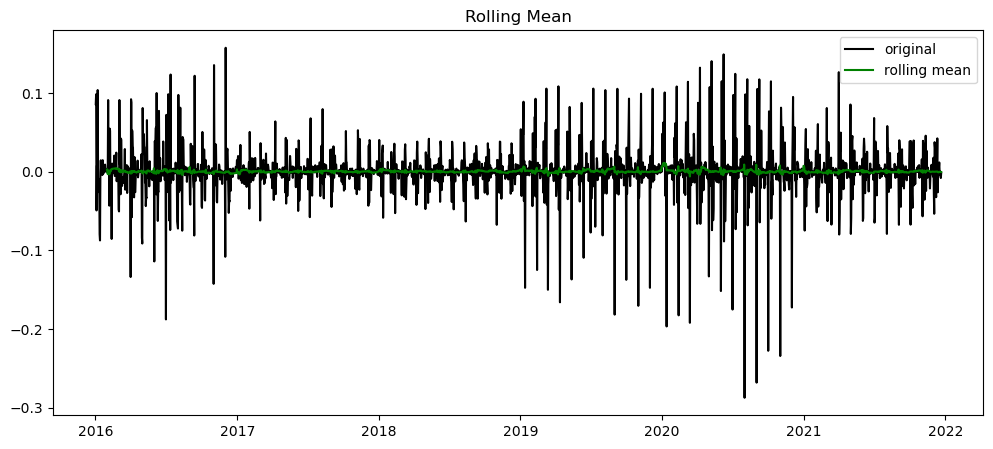

results of Dickey Fuller test :
Test Statistic                  -21.394232
p-value                           0.000000
#Lags Used                       26.000000
Number of Observations Used    2154.000000
critical value (1%)              -3.433390
critical value (5%)              -2.862883
critical value (10%)             -2.567485
dtype: float64


In [103]:
#test stationary after differencing 
test_stationarity(data_boxcox_diff)

In [104]:
#adfuller test for boxcox transformation with differencing
adf_test(data_boxcox_diff.price)

reject the null hypothesis
Data is  stationary


Finally our Data is Stationary and ready for AR Forecasting

## ARIMA hyperparameter Tuning

p = Periods to lag for eg: (if P= 3 then we will use the three previous periods of our time series in the autoregressive portion of the calculation) P helps adjust the line that is being fitted to forecast the series.

d = In an ARIMA model we transform a time series into stationary one(series without trend or seasonality) using differencing. D refers to the number of differencing transformations required by the time series to get stationary.

q = This variable denotes the lag of the error component, where error component is a part of the time series not explained by trend or seasonality.

In [105]:
#splitting our data into train and test 
train_data = data_boxcox_diff.head(2092)
test_data = data_boxcox_diff.tail(89)

In [106]:
# walk-forward validation
history = [x for x in train_data.price]
predictions = []
for i in range (len(test_data.price)):
    yhat = history[-1]
    predictions.append(yhat)
 # observation   
    obs = test_data.price[i]
    history.append(obs)
    print('>Predicted=%.3f, Expected=%.3f' % (yhat, obs))
rmse = np.sqrt(mean_squared_error(test_data.price, predictions))
print('RMSE: %.3f' % rmse)

>Predicted=-0.011, Expected=-0.001
>Predicted=-0.001, Expected=0.002
>Predicted=0.002, Expected=0.000
>Predicted=0.000, Expected=-0.001
>Predicted=-0.001, Expected=-0.004
>Predicted=-0.004, Expected=-0.002
>Predicted=-0.002, Expected=0.016
>Predicted=0.016, Expected=0.039
>Predicted=0.039, Expected=-0.011
>Predicted=-0.011, Expected=-0.067
>Predicted=-0.067, Expected=0.039
>Predicted=0.039, Expected=0.035
>Predicted=0.035, Expected=0.026
>Predicted=0.026, Expected=-0.029
>Predicted=-0.029, Expected=-0.046
>Predicted=-0.046, Expected=0.022
>Predicted=0.022, Expected=0.004
>Predicted=0.004, Expected=0.040
>Predicted=0.040, Expected=-0.017
>Predicted=-0.017, Expected=-0.001
>Predicted=-0.001, Expected=-0.001
>Predicted=-0.001, Expected=-0.016
>Predicted=-0.016, Expected=-0.002
>Predicted=-0.002, Expected=0.000
>Predicted=0.000, Expected=0.002
>Predicted=0.002, Expected=0.001
>Predicted=0.001, Expected=0.005
>Predicted=0.005, Expected=0.000
>Predicted=0.000, Expected=0.007
>Predicted=0.007

Identification of an AR model is often best done with the PACF.

- For an AR model, the theoretical PACF “shuts off” past the order of the model. The phrase “shuts off” means that in theory the partial autocorrelations are equal to 0 beyond that point. Put another way, the number of non-zero partial autocorrelations gives the order of the AR model. By the “order of the model” we mean the most extreme lag of x that is used as a predictor.

Identification of an MA model is often best done with the ACF rather than the PACF.

- For an MA model, the theoretical PACF does not shut off, but instead tapers toward 0 in some manner. A clearer pattern for an MA model is in the ACF. The ACF will have non-zero autocorrelations only at lags involved in the model.


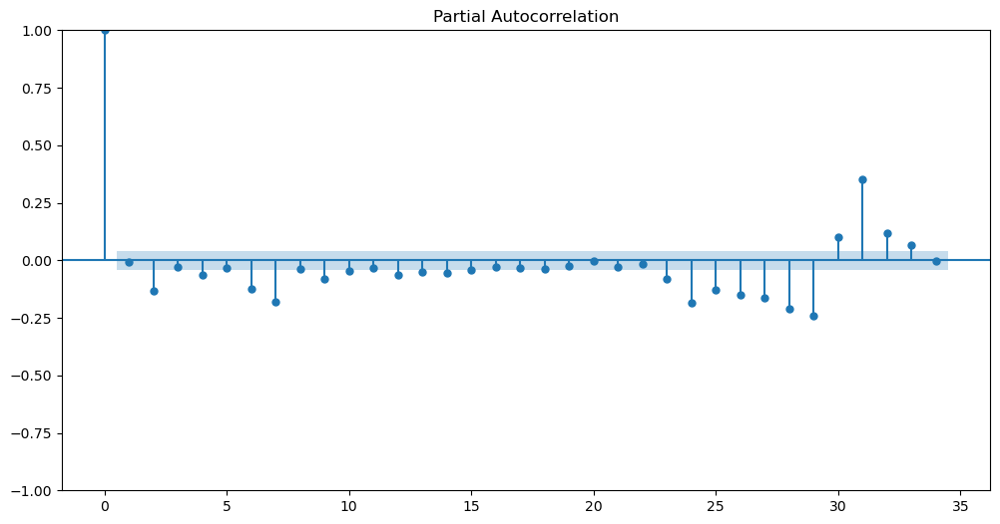

In [107]:
# PACF Plot    
with plt.rc_context():
    plt.rc("figure", figsize=(12,6))
    tsa_plots.plot_pacf(data_boxcox_diff.price,use_vlines=True)
    plt.show()

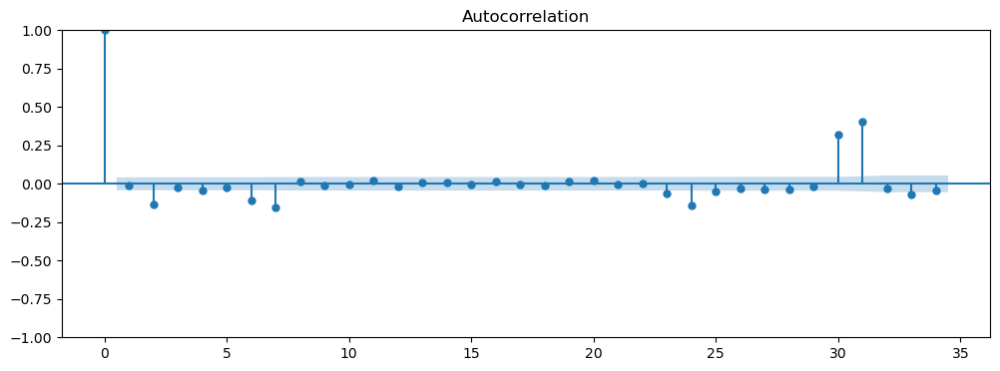

In [108]:
#Acf plot for gold price
with plt.rc_context():
    plt.rc("figure", figsize=(12,4))
    tsa_plots.plot_acf(data_boxcox_diff.price)
    plt.show()

Inverse Transformation of Box-cox Differencing

In [109]:
model = ARIMA(train_data,order=(3,0,1))
model_fit = model.fit()
y_hat_ar = data_boxcox_diff.copy()
y_hat_ar['arima_forecast'] = model_fit.predict(data_boxcox_diff.index.min(),data_boxcox_diff.index.max())
# We did differencing. So we need to revert it by adding the consecutive observations.
# For that we are using cumsum() method
y_hat_ar['arima_forecast'] = y_hat_ar['arima_forecast'].cumsum()
# We removed the first observations after differencing as it was null. Hence, adding the first observation back.
y_hat_ar['arima_forecast'] = y_hat_ar['arima_forecast'].add(data_boxcox.price[0])
# Now doing the reverse transformation 
# We have done Box Cox Log Log transformation with lambda = 0
# Hence, we have to the exponential as it is the reverse of the log.
y_hat_ar['arima_forecast'] = np.exp(y_hat_ar['arima_forecast'])

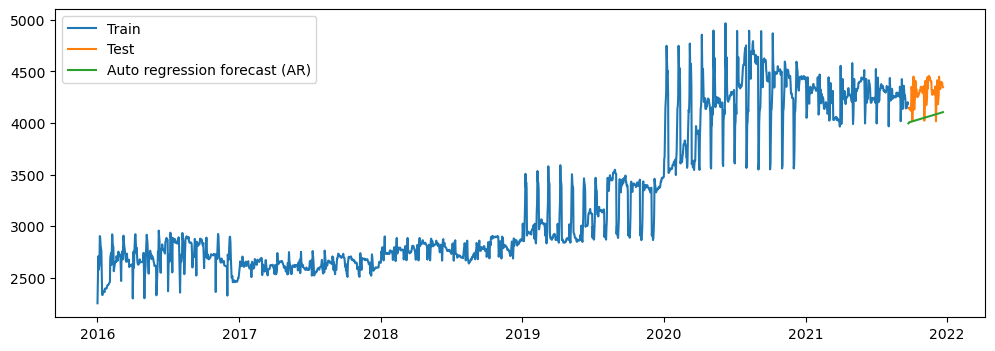

In [110]:
#plotting our arima model
plt.figure(figsize=(12,4))
plt.plot(train['price'], label='Train')
plt.plot(test, label='Test')
plt.plot(y_hat_ar['arima_forecast'][test.index.min():], label='Auto regression forecast (AR)')
plt.legend(loc='best')
plt.show()

In [111]:
# Rmse of arima model 
rmse_ARIMA = np.sqrt(mean_squared_error(test, y_hat_ar['arima_forecast'][test.index.min():])).round(2)
rmse_ARIMA

257.37

In [112]:
mape_arima = round(np.mean(np.abs((test.price - y_hat_ar['arima_forecast'][test.index.min():])/test.price)*100),2)
mape_arima

5.6

In [113]:
## residuals must be closer to zero or zero ##
model_residual = model_fit.resid
model_residual.mean()

1.7091999881520177e-05

In [114]:
##residuals must be stationary ##
adf_test(model_residual)

reject the null hypothesis
Data is  stationary


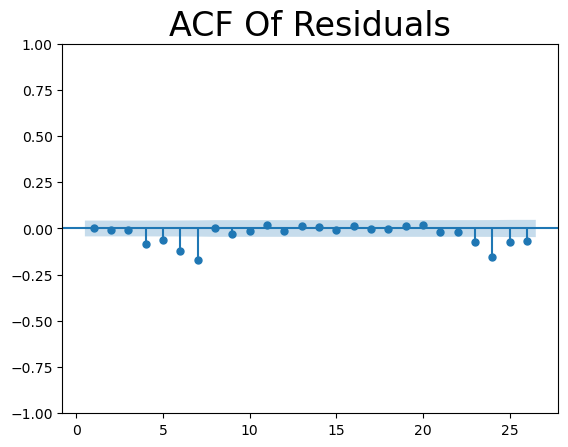

In [115]:
## no autocorrelaton between the residuals ##
plot_acf(model_residual, zero = False, lags = 26)
plt.title("ACF Of Residuals",size=24)
plt.show()

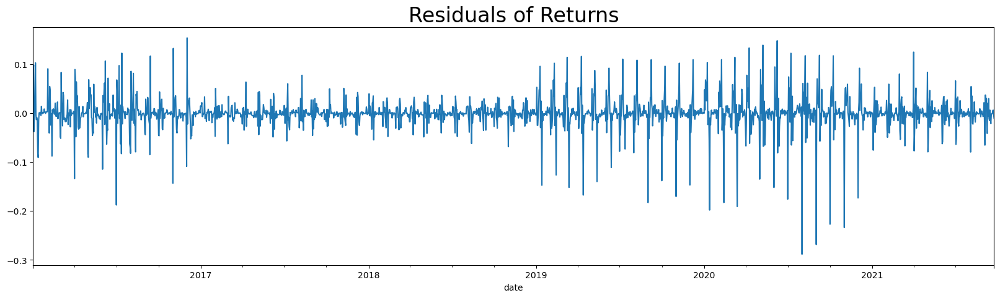

In [116]:
## residuals must be random ##
model_residual.plot(figsize=(20,5))
plt.title("Residuals of Returns", size=24)
plt.show()

In [117]:
model_fit.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  price   No. Observations:                 2092
Model:                 ARIMA(3, 0, 1)   Log Likelihood                4229.608
Date:                Wed, 24 May 2023   AIC                          -8447.216
Time:                        14:56:55   BIC                          -8413.341
Sample:                    01-02-2016   HQIC                         -8434.806
                         - 09-23-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0003      0.001      0.425      0.671      -0.001       0.002
ar.L1         -0.0054      0.825     -0.007      0.995      -1.622       1.611
ar.L2         -0.1289      0.021     -6.230      0.000      -0.169      -0.088
ar.L3         -0.0211      0.106     -0.200      0.841      -0.228       0.186
ma.L1         -0.0100      0.823     -0.012      0.990      -1.623       1.603
sigma2         0.0010   1.16e-05     88.714      0.000       0.001       0.001
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):             21948.16
Prob(Q):                              0.97   Prob(JB):                         0.00
Heteroskedasticity (H):               1.98   Skew:                            -1.50
Prob(H) (two-sided):                  0.00   Kurtosis:                        18.58
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

# Seasonal Auto Regressive Integrated Moving Average With Exogenous Factors (SARIMAX)

In [118]:

p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
pdqs = [(x[0], x[1], x[2], 30) for x in list(itertools.product(p, d, q))]

# Run grid

def sarimax_gridsearch(data_boxcox, pdq, pdqs, maxiter=20, freq='D'):
    ans = []
    for comb in pdq:
        for combs in pdqs:
            try:
                mod = sm.tsa.statespace.SARIMAX(data_boxcox,
                                               order=comb,
                                               seasonal_order=combs,
                                               enforce_stationarity=False,
                                               enforce_invertibility=False,
                                               freq=freq)
                output = mod.fit(maxiter=maxiter)
                pred = output.get_prediction(start=pd.to_datetime('2016-01-01'), dynamic=False)
                y_pred = pred.predicted_mean
                y_true = data_boxcox[pred.row_labels[0]:]

                # Calculate RMSE
                rmse = np.sqrt(mean_squared_error(y_true, y_pred))
                
                ans.append([comb, combs, output.bic, rmse])
                print('SARIMAX {} x {} 30: BIC = {}, RMSE = {}'.format(comb, combs, output.bic, rmse))
            except:
                continue

    ans_df = pd.DataFrame(ans, columns=['pdq', 'pdqs', 'bic', 'rmse'])
    ans_df = ans_df.sort_values(by=['bic'], ascending=True)[:5]
    return ans_df


In [119]:
sarimax_gridsearch(data_boxcox,pdq,pdqs,freq='D')

SARIMAX (0, 0, 0) x (0, 0, 0, 30) 30: BIC = 15309.520920107607, RMSE = 8.077054644943303
SARIMAX (0, 0, 0) x (0, 0, 1, 30) 30: BIC = 12286.489661016678, RMSE = 4.2953484073821455
SARIMAX (0, 0, 0) x (0, 1, 0, 30) 30: BIC = -7011.397470987363, RMSE = 0.9182550035603431
SARIMAX (0, 0, 0) x (0, 1, 1, 30) 30: BIC = -7026.353969426214, RMSE = 0.9182403168064313
SARIMAX (0, 0, 0) x (1, 0, 0, 30) 30: BIC = -7059.763840493392, RMSE = 0.9182247274623327
SARIMAX (0, 0, 0) x (1, 0, 1, 30) 30: BIC = -7019.868193755719, RMSE = 0.9182411278160914
SARIMAX (0, 0, 0) x (1, 1, 0, 30) 30: BIC = -7028.56282816157, RMSE = 0.9200767609826352
SARIMAX (0, 0, 0) x (1, 1, 1, 30) 30: BIC = -7018.821461812479, RMSE = 0.9217611843720929
SARIMAX (0, 0, 1) x (0, 0, 0, 30) 30: BIC = 12305.01318404467, RMSE = 4.060337397978542
SARIMAX (0, 0, 1) x (0, 0, 1, 30) 30: BIC = 9329.723282458644, RMSE = 2.3157747042633643
SARIMAX (0, 0, 1) x (0, 1, 0, 30) 30: BIC = -7874.3721165226525, RMSE = 0.9178531815710144
SARIMAX (0, 0,

,pdq,pdqs,bic,rmse
60,"(1, 1, 1)","(1, 0, 0, 30)",-9071.365541,0.172447
61,"(1, 1, 1)","(1, 0, 1, 30)",-9057.778700,0.174305
28,"(0, 1, 1)","(1, 0, 0, 30)",-9051.132570,0.171997
29,"(0, 1, 1)","(1, 0, 1, 30)",-9034.395306,0.173732
52,"(1, 1, 0)","(1, 0, 0, 30)",-8997.893773,0.171925


In [120]:
#splitting our data into train and test split
size = 2092
train_boxcox = data_boxcox[:size]
test_boxcox = data_boxcox[size:]

In [121]:
#fitting sarimax model 
model_sar = SARIMAX(train_boxcox,order=(1,1,1),seasonal_order=(1,0,0,30))
model_sar = model_sar.fit()
y_hat_sar = data_boxcox_diff.copy()

In [122]:
#inversing the boxcox transformation 
y_hat_sar['sarima_forecast_boxcox'] = model_sar.predict(data_boxcox_diff.index.min(),data_boxcox_diff.index.max())
y_hat_sar['sarima_forecast'] = np.exp(y_hat_sar['sarima_forecast_boxcox'])


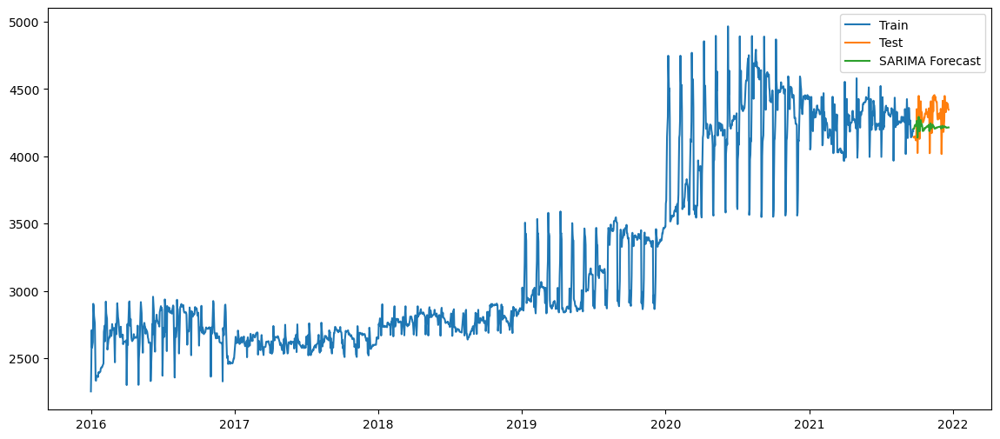

In [123]:
plt.figure(figsize=(14,6))
plt.plot(train['price'], label='Train')
plt.plot(test, label='Test')
plt.plot(y_hat_sar['sarima_forecast'][test.index.min():], label='SARIMA Forecast')
plt.legend(loc='best')
plt.show()

In [124]:
rmse_sarima = np.sqrt(mean_squared_error(test, y_hat_sar['sarima_forecast'][test.index.min():])).round(2)
rmse_sarima

122.37

In [125]:
rmse_sarima_train = np.sqrt(mean_squared_error(train[:len(y_hat_sar['sarima_forecast'])], y_hat_sar['sarima_forecast'][:len(train)])).round(2)
rmse_sarima_train

60.31

In [126]:
model_sar.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               price   No. Observations:                 2092
Model:             SARIMAX(1, 1, 1)x(1, 0, [], 30)   Log Likelihood                4437.353
Date:                             Wed, 24 May 2023   AIC                          -8866.705
Time:                                     15:02:31   BIC                          -8844.124
Sample:                                 01-01-2016   HQIC                         -8858.433
                                      - 09-22-2021                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7114      0.015     45.949      0.000       0.681       0.742
ma.L1         -0.9628      0.006   -154.839      0.000      -0.975      -0.951
ar.S.L30       0.3755      0.010     38.957      0.000       0.357       0.394
sigma2         0.0008   1.08e-05     77.909      0.000       0.001       0.001
===================================================================================
Ljung-Box (L1) (Q):                   1.80   Jarque-Bera (JB):             16164.97
Prob(Q):                              0.18   Prob(JB):                         0.00
Heteroskedasticity (H):               2.04   Skew:                            -0.98
Prob(H) (two-sided):                  0.00   Kurtosis:                        16.48
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [127]:
#mean absolute error
mape_sarima = round(np.mean(np.abs((test.price - y_hat_sar['sarima_forecast'][test.index.min():])/test.price)*100),2)
mape_sarima

2.46

In [128]:
## residuals must be closer to zero or zero ##
model_residual_sar = model_sar.resid
model_residual_sar.mean()

0.004987274901351311

In [129]:
##residuals must be stationary ##
adf_test(model_residual_sar)

reject the null hypothesis
Data is  stationary


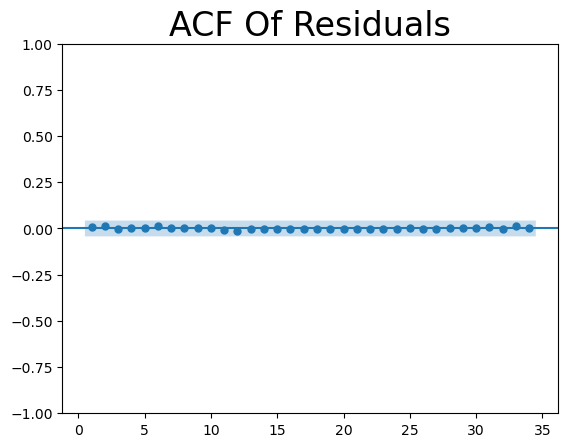

In [130]:
## no autocorrelaton between the residuals ##
plot_acf(model_residual_sar, zero = False)
plt.title("ACF Of Residuals",size=24)
plt.show()

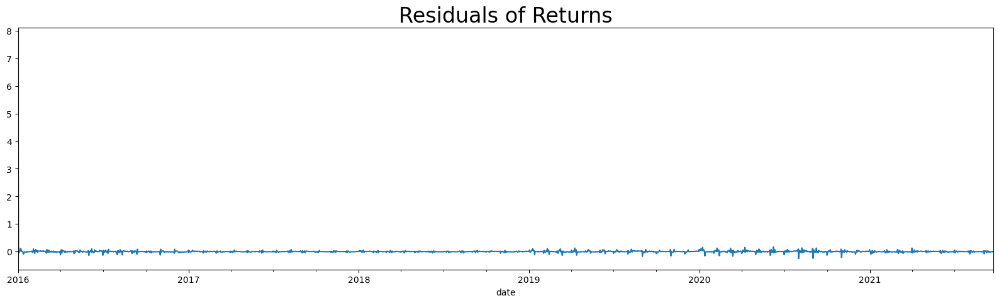

In [131]:
#residuals must be random
model_residual_sar.plot(figsize=(20,5))
plt.title("Residuals of Returns", size=24)
plt.show()

In [132]:
#comparing all the results of all models 
#comparing the results for all models 

Results = {"Models":pd.Series(["Simple_Exp","Double_Exp","Triple_add_Exp","Triple_mul_add_Exp","Triple_add_mul_Exp"\
                                 ,"triple_mul_mul_Exp","Arima","Sarimax"]),\
             
             "Test_Mape(%)":pd.Series([mape_ses,mape_exp,mape_add_texp,mape_mul_add_texp,mape_add_mul_texp,mape_mul_mul_texp,mape_arima,mape_sarima]),\
             "Test_RMSE_Values":pd.Series([test_rmse_ses,test_rmse_exp,test_rmse_add_texp,test_rmse_mul_add_texp,test_rmse_add_mul_texp,test_rmse_mul_mul_texp,rmse_ARIMA,rmse_sarima])}
table_eval = pd.DataFrame(Results)
table_eval.sort_values(['Test_Mape(%)'],inplace=True,ignore_index=True)
table_eval

,Models,Test_Mape(%),Test_RMSE_Values
0,Sarimax,2.460000,122.370000
1,Triple_add_Exp,2.521810,127.207331
2,triple_mul_mul_Exp,2.906570,150.950077
3,Simple_Exp,2.942672,145.774119
4,Triple_mul_add_Exp,3.087946,160.650980
5,Double_Exp,4.481962,218.151341
6,Arima,5.600000,257.370000
7,Triple_add_mul_Exp,14.473640,766.443532


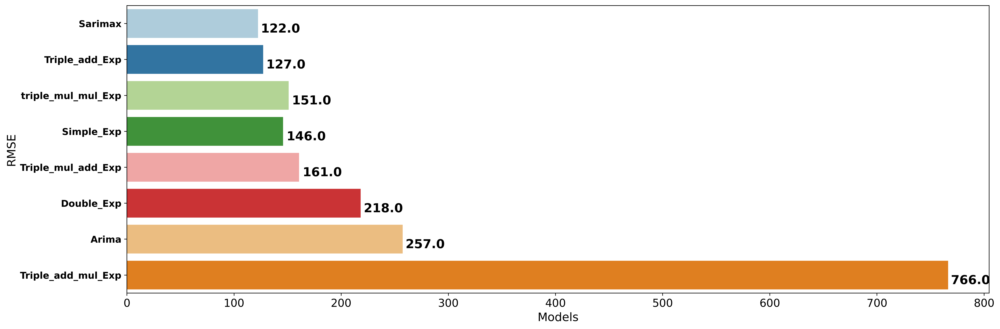

In [133]:
## Visualizing Models performance
f,ax = plt.subplots(1,1,figsize = (18,6),dpi = 500)
sn.barplot(x = 'Test_RMSE_Values',y = 'Models',data = table_eval,ax = ax,palette='Paired')
ax.set_xlabel('Models',size = 15)
ax.set_ylabel('RMSE',size = 15)
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=14)

for i,v in enumerate(np.round(table_eval.Test_RMSE_Values.values,0)):
    ax.text(v + 3,i + .25,str(v),
           color = 'black',fontweight = 'bold', fontsize= 16)
plt.tight_layout()

## Conclusion

- After applying all models we observe that we have captured the trend and seasonality with some models while some models were not able to capture.


- We also observe that our Arima and Sarimax models have performed better than data driven models,but sarimax gave us best results while compared to other models with lowest rmse

## Model Driven Methods

In [134]:
#preprocessing our data 
df_gold5 = df_gold4.copy()
df_gold5.reset_index(inplace=True)
df_gold5['t'] = np.arange(1,len(df_gold5)+1)
df_gold5['t_squared'] = np.square(df_gold5.t)
df_gold5['month'] = df_gold5.date.dt.strftime("%b")
df_gold5['year'] = df_gold5.date.dt.strftime("%Y")
months = pd.get_dummies(df_gold5['month'])
months = months[['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']]
df_gold5 = pd.concat([df_gold5,months],axis = 1)
df_gold5['log_price'] = np.log(df_gold5['price'])

In [135]:
df_gold5 #dataset

,date,price,t,t_squared,month,year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,log_price
0,2016-01-01,2252.60,1,1,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.719840
1,2016-01-02,2454.50,2,4,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.805678
2,2016-01-03,2708.10,3,9,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.904003
3,2016-01-04,2577.80,4,16,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.854692
4,2016-01-05,2597.75,5,25,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.862401
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2177,2021-12-17,4394.40,2178,4743684,Dec,2021,0,0,0,0,0,0,0,0,0,0,0,1,8.388086
2178,2021-12-18,4389.50,2179,4748041,Dec,2021,0,0,0,0,0,0,0,0,0,0,0,1,8.386971
2179,2021-12-19,4389.50,2180,4752400,Dec,2021,0,0,0,0,0,0,0,0,0,0,0,1,8.386971
2180,2021-12-20,4354.10,2181,4756761,Dec,2021,0,0,0,0,0,0,0,0,0,0,0,1,8.378873


In [136]:
#splitting into train and test 
train_df = df_gold5[:size]
test_df = df_gold5[size:]

In [137]:
#print shape 
print(train_df.shape,test_df.shape)

(2092, 19) (90, 19)


- Linear Model by OLS Method

In [138]:
lin_model = smf.ols('price~t',data=train_df).fit()
pred_lin = pd.Series(lin_model.predict(pd.DataFrame(test_df['t'])))
rmse_lin = np.sqrt(np.mean((np.array(test_df['price'])-np.array(pred_lin))**2))
rmse_lin

106.60021019845378

In [139]:
lin_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.759
Model:                            OLS   Adj. R-squared:                  0.759
Method:                 Least Squares   F-statistic:                     6587.
Date:                Wed, 24 May 2023   Prob (F-statistic):               0.00
Time:                        15:02:34   Log-Likelihood:                -15192.
No. Observations:                2092   AIC:                         3.039e+04
Df Residuals:                    2090   BIC:                         3.040e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2180.2529     15.090    144.487      0.000    2150.661    2209.845
t              1.0136      0.012     81.161      0.000       0.989       1.038
==============================================================================
Omnibus:                       86.766   Durbin-Watson:                   0.111
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               74.297
Skew:                           0.392   Prob(JB):                     7.36e-17
Kurtosis:                       2.513   Cond. No.                     2.42e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.42e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

- Exponential

In [140]:
exp_model = smf.ols('log_price~t',data=train_df).fit()
pred_exp = pd.Series(exp_model.predict(pd.DataFrame(test_df['t'])))
rmse_exp = np.sqrt(np.mean((np.array(test_df['price'])-np.array(pred_exp))**2))
rmse_exp

4287.364916191936

In [141]:
exp_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.783
Model:                            OLS   Adj. R-squared:                  0.782
Method:                 Least Squares   F-statistic:                     7522.
Date:                Wed, 24 May 2023   Prob (F-statistic):               0.00
Time:                        15:02:34   Log-Likelihood:                 1945.0
No. Observations:                2092   AIC:                            -3886.
Df Residuals:                    2090   BIC:                            -3875.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      7.7479      0.004   1853.909      0.000       7.740       7.756
t              0.0003   3.46e-06     86.731      0.000       0.000       0.000
==============================================================================
Omnibus:                      127.362   Durbin-Watson:                   0.115
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               77.104
Skew:                           0.334   Prob(JB):                     1.81e-17
Kurtosis:                       2.338   Cond. No.                     2.42e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.42e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

 - Additive Seasonality  

In [142]:
add_model = smf.ols('price~Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data=train_df).fit()
pred_add = pd.Series(add_model.predict(test_df[['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep',
       'Oct', 'Nov', 'Dec']]))
rmse_add = np.sqrt(np.mean((np.array(test_df['price'])-np.array(pred_add))**2))
rmse_add

1135.1772567141277

In [143]:
add_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     2.344
Date:                Wed, 24 May 2023   Prob (F-statistic):            0.00724
Time:                        15:02:34   Log-Likelihood:                -16668.
No. Observations:                2092   AIC:                         3.336e+04
Df Residuals:                    2080   BIC:                         3.343e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2988.4075     14.176    210.810      0.000    2960.607    3016.208
Jan          177.3888     49.312      3.597      0.000      80.683     274.095
Feb          226.4240     51.397      4.405      0.000     125.629     327.218
Mar          190.0175     49.312      3.853      0.000      93.311     286.724
Apr          265.4583     50.060      5.303      0.000     167.285     363.632
May          282.0033     49.312      5.719      0.000     185.297     378.709
Jun          302.7700     50.060      6.048      0.000     204.596     400.944
Jul          337.8576     49.312      6.851      0.000     241.151     434.564
Aug          389.1600     49.312      7.892      0.000     292.454     485.866
Sep          334.6762     51.120      6.547      0.000     234.425     434.928
Oct          193.6112     53.645      3.609      0.000      88.407     298.815
Nov          151.0675     54.471      2.773      0.006      44.245     257.890
Dec          137.9730     53.645      2.572      0.010      32.769     243.177
==============================================================================
Omnibus:                      683.156   Durbin-Watson:                   0.027
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              285.570
Skew:                           0.746   Prob(JB):                     9.76e-63
Kurtosis:                       1.977   Cond. No.                     3.04e+15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.45e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

- Quadratic

In [144]:
quad_model = smf.ols('price~t+t_squared',data=train_df).fit()
pred_quad = pd.Series(quad_model.predict(pd.DataFrame(test_df[["t","t_squared"]])))
rmse_quad = np.sqrt(np.mean((np.array(test_df['price'])-np.array(pred_quad))**2))
rmse_quad

614.903921309149

In [145]:
quad_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.856
Model:                            OLS   Adj. R-squared:                  0.856
Method:                 Least Squares   F-statistic:                     6233.
Date:                Wed, 24 May 2023   Prob (F-statistic):               0.00
Time:                        15:02:35   Log-Likelihood:                -14650.
No. Observations:                2092   AIC:                         2.931e+04
Df Residuals:                    2089   BIC:                         2.932e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2671.0702     17.487    152.745      0.000    2636.776    2705.364
t             -0.3927      0.039    -10.178      0.000      -0.468      -0.317
t_squared      0.0007   1.79e-05     37.638      0.000       0.001       0.001
==============================================================================
Omnibus:                      354.165   Durbin-Watson:                   0.186
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              726.922
Skew:                           0.998   Prob(JB):                    1.42e-158
Kurtosis:                       5.086   Cond. No.                     5.88e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.88e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

- Additive Seasonality Quadratic

In [146]:
add_model_sea = smf.ols('price~t+t_squared+Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data=train_df).fit()
pred_add_sea = pd.Series(add_model_sea.predict(test_df[['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep',
       'Oct', 'Nov', 'Dec','t','t_squared']]))
rmse_add_sea = np.sqrt(np.mean((np.array(test_df['price'])-np.array(pred_add_sea))**2))
rmse_add_sea

585.653874281973

In [147]:
add_model_sea.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.859
Model:                            OLS   Adj. R-squared:                  0.858
Method:                 Least Squares   F-statistic:                     970.4
Date:                Wed, 24 May 2023   Prob (F-statistic):               0.00
Time:                        15:02:35   Log-Likelihood:                -14635.
No. Observations:                2092   AIC:                         2.930e+04
Df Residuals:                    2078   BIC:                         2.938e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2457.1592     16.280    150.932      0.000    2425.233    2489.086
t             -0.3731      0.039     -9.589      0.000      -0.449      -0.297
t_squared      0.0007    1.8e-05     36.854      0.000       0.001       0.001
Jan          224.0764     18.673     12.000      0.000     187.456     260.697
Feb          247.6054     19.460     12.724      0.000     209.441     285.769
Mar          183.4182     18.675      9.822      0.000     146.795     220.042
Apr          229.6116     18.965     12.107      0.000     192.419     266.804
May          215.6681     18.693     11.538      0.000     179.010     252.327
Jun          204.7190     18.990     10.780      0.000     167.478     241.960
Jul          206.8498     18.726     11.046      0.000     170.127     243.573
Aug          223.3940     18.748     11.915      0.000     186.626     260.162
Sep          198.6361     19.434     10.221      0.000     160.525     236.748
Oct          238.0512     20.494     11.616      0.000     197.860     278.242
Nov          164.9908     20.815      7.927      0.000     124.171     205.811
Dec          120.1387     20.516      5.856      0.000      79.904     160.373
==============================================================================
Omnibus:                      345.946   Durbin-Watson:                   0.187
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              687.210
Skew:                           0.991   Prob(JB):                    5.95e-150
Kurtosis:                       4.989   Cond. No.                     1.46e+22
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 3.76e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

- Multiplicative Seasonality

In [148]:
mul_sea = smf.ols('log_price~Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data = train_df).fit()
pred_mult_sea = pd.Series(mul_sea.predict(test_df))
rmse_mult_sea = np.sqrt(np.mean((np.array(test_df['price'])-np.array(np.exp(pred_mult_sea)))**2))
rmse_mult_sea

1196.4628688798919

In [149]:
mul_sea.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     2.293
Date:                Wed, 24 May 2023   Prob (F-statistic):            0.00873
Time:                        15:02:35   Log-Likelihood:                 361.55
No. Observations:                2092   AIC:                            -699.1
Df Residuals:                    2080   BIC:                            -631.4
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      7.4408      0.004   1800.398      0.000       7.433       7.449
Jan            0.5973      0.014     41.547      0.000       0.569       0.626
Feb            0.6163      0.015     41.131      0.000       0.587       0.646
Mar            0.6050      0.014     42.080      0.000       0.577       0.633
Apr            0.6245      0.015     42.789      0.000       0.596       0.653
May            0.6281      0.014     43.692      0.000       0.600       0.656
Jun            0.6361      0.015     43.583      0.000       0.607       0.665
Jul            0.6443      0.014     44.818      0.000       0.616       0.673
Aug            0.6595      0.014     45.876      0.000       0.631       0.688
Sep            0.6463      0.015     43.368      0.000       0.617       0.676
Oct            0.6053      0.016     38.701      0.000       0.575       0.636
Nov            0.5922      0.016     37.288      0.000       0.561       0.623
Dec            0.5858      0.016     37.458      0.000       0.555       0.617
==============================================================================
Omnibus:                     1504.153   Durbin-Watson:                   0.025
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              258.798
Skew:                           0.630   Prob(JB):                     6.35e-57
Kurtosis:                       1.824   Cond. No.                     3.04e+15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.45e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

- Multiplicative Additive Seasonality

In [150]:
Mul_Add_sea = smf.ols('log_price~t+Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data = train_df).fit()
pred_Mult_add_sea = pd.Series(Mul_Add_sea.predict(test_df))
rmse_Mult_add_sea = np.sqrt(np.mean((np.array(test_df['price'])-np.array(np.exp(pred_Mult_add_sea)))**2))
rmse_Mult_add_sea 

115.81388874221041

In [151]:
Mul_Add_sea.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     650.9
Date:                Wed, 24 May 2023   Prob (F-statistic):               0.00
Time:                        15:02:35   Log-Likelihood:                 1980.3
No. Observations:                2092   AIC:                            -3935.
Df Residuals:                    2079   BIC:                            -3861.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      7.1502      0.004   1870.316      0.000       7.143       7.158
t              0.0003   3.43e-06     87.707      0.000       0.000       0.000
Jan            0.6083      0.007     91.694      0.000       0.595       0.621
Feb            0.6190      0.007     89.542      0.000       0.605       0.633
Mar            0.5981      0.007     90.168      0.000       0.585       0.611
Apr            0.6085      0.007     90.330      0.000       0.595       0.622
May            0.6029      0.007     90.817      0.000       0.590       0.616
Jun            0.6017      0.007     89.209      0.000       0.588       0.615
Jul            0.6008      0.007     90.323      0.000       0.588       0.614
Aug            0.6067      0.007     91.086      0.000       0.594       0.620
Sep            0.5972      0.007     86.569      0.000       0.584       0.611
Oct            0.5890      0.007     81.599      0.000       0.575       0.603
Nov            0.5667      0.007     77.285      0.000       0.552       0.581
Dec            0.5512      0.007     76.273      0.000       0.537       0.565
==============================================================================
Omnibus:                      138.058   Durbin-Watson:                   0.117
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               83.742
Skew:                           0.355   Prob(JB):                     6.54e-19
Kurtosis:                       2.324   Cond. No.                     9.82e+18
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 3.17e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [152]:
data = {"Models":pd.Series(["rmse_linear","rmse_Exp","rmse_Quad","rmse_add_sea","rmse_add_sea_quad","rmse_mult_sea","rmse_Mult_add_sea"]),"Test_RMSE_Values":
        pd.Series([rmse_lin,rmse_exp,rmse_quad,rmse_add,rmse_add_sea,rmse_mult_sea,rmse_Mult_add_sea])}
table_rmse=pd.DataFrame(data)
table_rmse.sort_values(['Test_RMSE_Values'], inplace=True, ignore_index=True)

In [153]:
table_rmse

,Models,Test_RMSE_Values
0,rmse_linear,106.600210
1,rmse_Mult_add_sea,115.813889
2,rmse_add_sea_quad,585.653874
3,rmse_Quad,614.903921
4,rmse_add_sea,1135.177257
5,rmse_mult_sea,1196.462869
6,rmse_Exp,4287.364916


In [154]:
e = table_rmse.append(table_eval)
e.drop('Test_Mape(%)', axis=1, inplace=True)
e.sort_values(['Test_RMSE_Values'], inplace=True, ignore_index=True)

In [155]:
e

,Models,Test_RMSE_Values
0,rmse_linear,106.600210
1,rmse_Mult_add_sea,115.813889
2,Sarimax,122.370000
3,Triple_add_Exp,127.207331
4,Simple_Exp,145.774119
5,triple_mul_mul_Exp,150.950077
6,Triple_mul_add_Exp,160.650980
7,Double_Exp,218.151341
8,Arima,257.370000
9,rmse_add_sea_quad,585.653874


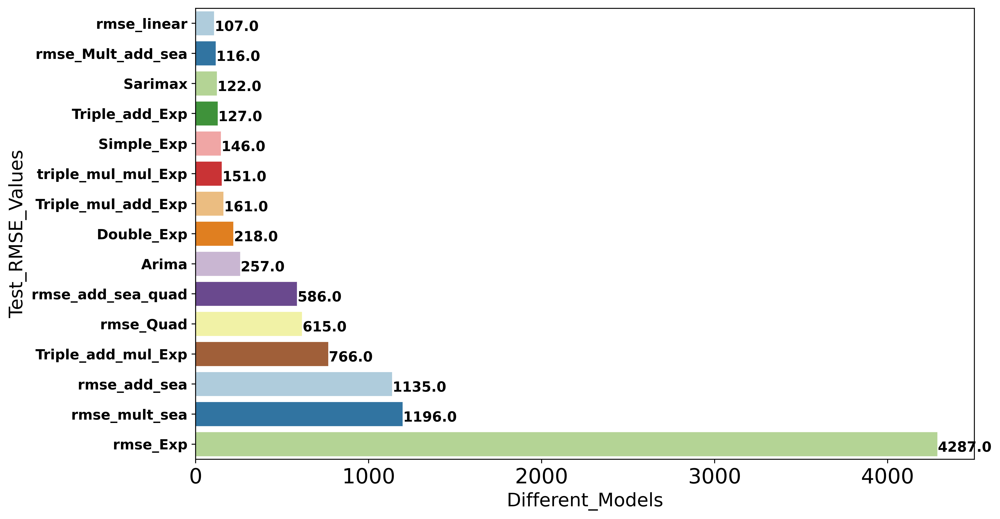

In [156]:
f, axe = plt.subplots(1,1, figsize=(12,7), dpi=500)
sn.barplot(x='Test_RMSE_Values', y='Models', data=e, ax = axe,palette='Paired')
axe.set_xlabel('Different_Models', size=16)
axe.set_ylabel('Test_RMSE_Values', size=16)
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=18)

for i, v in enumerate(np.round(e.Test_RMSE_Values.values,0)):
    axe.text(v + 3, i + .25, str(v),
            color = 'black', fontweight = 'bold', fontsize= 12)

plt.show()


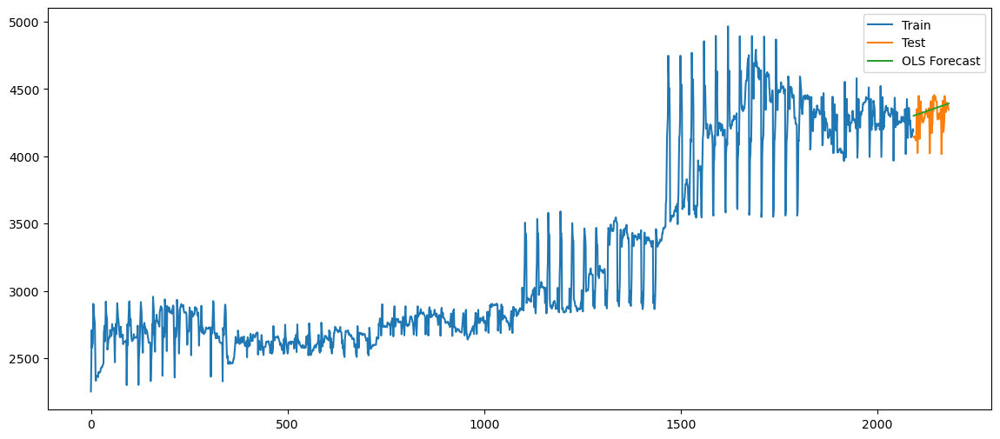

In [157]:
#checking with the final predictions and plotting for  the chosen model
plt.figure(figsize=(14,6))
plt.plot(train_df['price'], label='Train')
plt.plot(test_df['price'], label='Test')
plt.plot(pred_lin, label='OLS Forecast')
plt.legend(loc='best')
plt.show()

In [158]:
#checking our model with new data with t as number of days lagged
new_data_df = pd.DataFrame({'t': range(2092,2182),'date':pd.date_range(start='2021-09-23',end='2021-12-21')})
predictions = lin_model.predict(new_data_df)
predictions

0     4300.719294
1     4301.732901
2     4302.746508
3     4303.760115
4     4304.773723
         ...     
85    4386.875913
86    4387.889520
87    4388.903127
88    4389.916735
89    4390.930342
Length: 90, dtype: float64

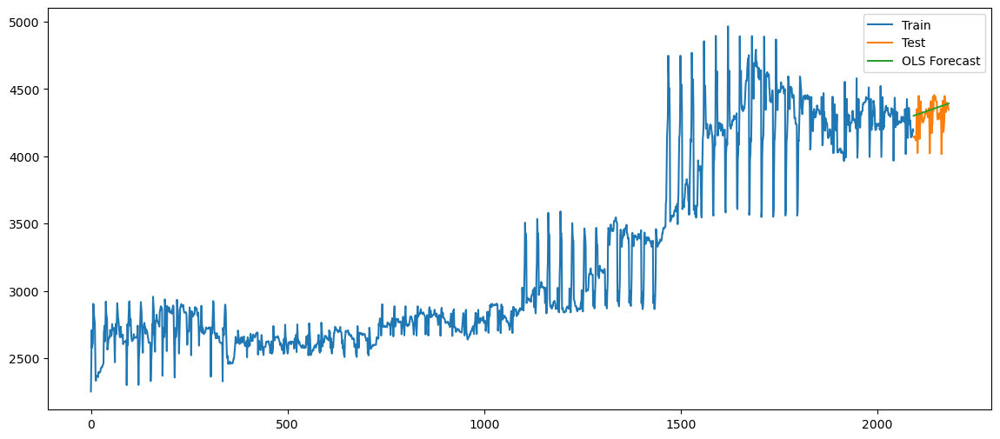

In [159]:
#checking with the final predictions and plotting for  the chosen model
plt.figure(figsize=(14,6))
plt.plot(train_df['price'], label='Train')
plt.plot(test_df['price'], label='Test')
plt.plot(pred_lin, label='OLS Forecast')
plt.legend(loc='best')
plt.show()

In [160]:
#extaracting open
df_gold7 = df_gold2.copy()
open_price = df_gold7.set_index('date').resample('M').first()

In [161]:
#extracting closing
close_price = df_gold7.set_index('date').resample('M').last()

In [162]:
#extracting highest price
high_price = df_gold7.set_index('date').resample('M').max()

In [163]:
#extracting lowest
low_price = df_gold7.set_index('date').resample('M').min()

In [164]:
#converting all to csv file 
open_price.to_csv("open_price.csv")
close_price.to_csv("close_price.csv")
high_price.to_csv("high_price.csv")
low_price.to_csv("low_price.csv")

In [166]:
#uploading and reading our file develeoped on excel
df_stock = pd.read_csv(r"stock_price_gold.csv")

In [167]:
#read data
df_stock

,date,open,close,high,low
0,1/31/2016,2252.60,2445.5,2903.8,2252.60
1,2/29/2016,2453.15,2724.8,2920.5,2453.15
2,3/31/2016,2596.80,2629.4,2908.2,2468.80
3,4/30/2016,2299.80,2521.5,2922.3,2299.80
4,5/31/2016,2301.30,2611.5,2916.8,2301.30
...,...,...,...,...,...
67,8/31/2021,4347.30,4252.5,4436.3,3967.30
68,9/30/2021,4351.30,4186.3,4425.4,4017.10
69,10/31/2021,4351.30,4289.6,4449.4,4024.40
70,11/30/2021,4357.20,4277.0,4455.6,4022.90


In [168]:
#plotting a candlestick chart
fig = go.Figure(data=[go.Candlestick(x=df_stock['date'],
                open=df_stock['open'],
                high=df_stock['high'],
                low=df_stock['low'],
                close=df_stock['close'])])
fig.update_layout(xaxis_rangeslider_visible=False)
fig.show()

## Observations
 
 - As we have extracted the monthly open,close,high and low prices of gold we observe variation from 2016 with the prices of gold, till 2018 fourth quarter the prices of gold were low but from 2018 the prices of gold drastically increased till 2020 fourth quarter.
 
 
 - the prices of gold from 2018 have seen an upward trend with seasonality varying time to time,but from the yeaar 2021 the prices of gold dipped down.
 
 
 - We can say that the  pandemic has affected on the prices of gold from 2018 to 2021, with least demand of gold in these years which added an inflation in the prices of gold, the lockdown hit the markets of gold supply and demand leading to volatility in prices of gold.
 
 
 
 - from 2021 as the lockdown was lifted the prices of gold seen a stability and in the coming years the gold rate will observe this kind of volatility,and future prices of gold will sometimes go through inflation, till the recovery is covered from pandemic.

## Predictions for New Data

## Model Conclusion

After application and observation of RMSE errors of all models,Though the linear model giving us least error, we went With the model with Holts Winter Triple Exponential Multiplicative Seasonality and trend ,Since the model is niether overfitting or underfitting and giving us a stable model, the model is also capturing trend and seasonality and also with least errors.  

In [169]:
#model results for selection
model_conclusion

,Models,Train_RMSE,Test_Mape(%),Test_RMSE_Values
0,Triple_add_Exp,123.269377,2.521810,127.207331
1,triple_mul_mul_Exp,130.054434,2.906570,150.950077
2,Simple_Exp,114.823297,2.942672,145.774119
3,Triple_mul_add_Exp,126.682376,3.087946,160.650980
4,Double_Exp,116.076772,4.481962,218.151341
5,Triple_add_mul_Exp,283.108746,14.473640,766.443532


In [170]:
predictions_2 = texp_mul_mul_model.forecast(90)

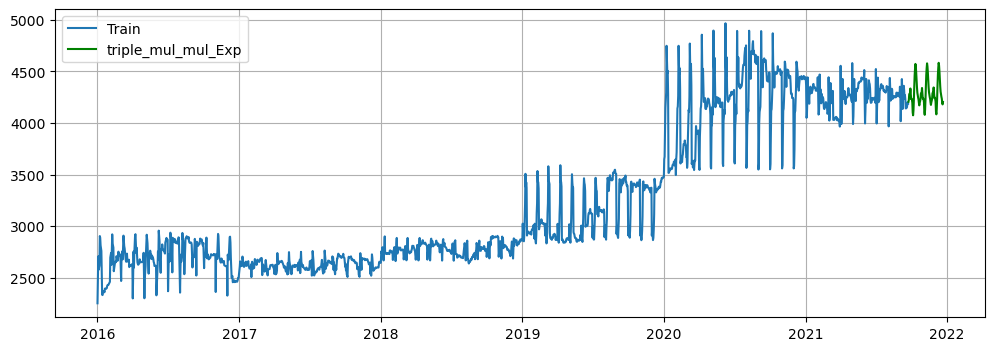

In [171]:
#checking with the final predictions and plotting for  the chosen model
plt.figure(figsize=(12,4))
plt.plot(train, label='Train')
plt.plot(predictions_2, label='triple_mul_mul_Exp',c = 'green')
plt.grid()
plt.legend(loc='best')
plt.show()

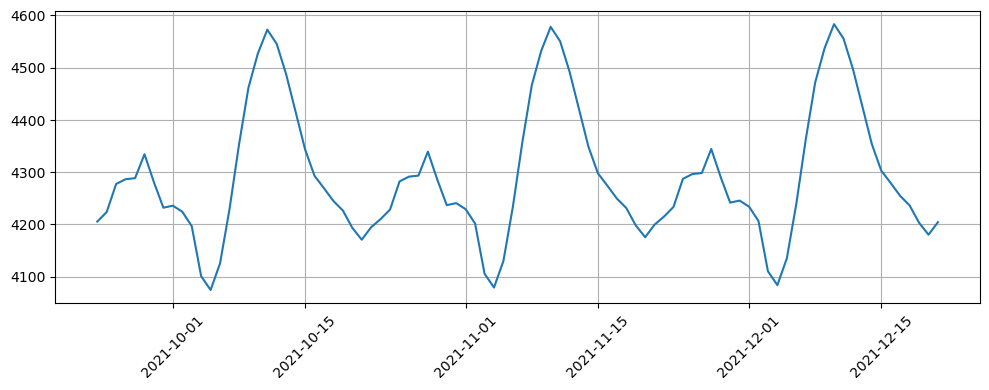

In [172]:
#plotting for next 3 months 
plt.figure(figsize=(10,4))
plt.plot(predictions_2, label='triple_mul_mul_Exp')
plt.xticks(rotation =45)
plt.grid()
plt.tight_layout()
plt.show()

In [173]:
#reseting the index of our original data 
df_gold6 = df_gold2.copy()
df_gold6 = df_gold6.set_index('date')

In [174]:
#fitting our model on  original data
texp_mul_mul_model_fin = ExponentialSmoothing(df_gold6,seasonal='mul',trend = 'mul',seasonal_periods=30).fit(optimized=True)

In [175]:
#forecasting for next 30 days according to our target forecasting
forecast_final = texp_mul_mul_model_fin.forecast(30)

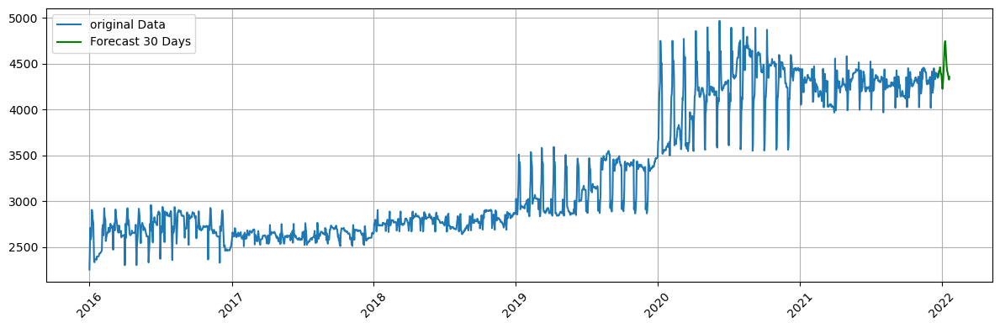

In [176]:
#checking with the final predictions and plotting for  the chosen model
plt.figure(figsize=(12,4))
plt.plot(df_gold6, label='original Data')
plt.plot(forecast_final, label='Forecast 30 Days',c = 'green')
plt.xticks(rotation = 45)
plt.legend(loc='best')
plt.grid()
plt.tight_layout()
plt.show()

In [177]:
#saving our model for future predctions
filename = 'final_model.sav'
pickle.dump(texp_mul_mul_model_fin,open(filename,'wb'))

In [178]:
loaded_model = pickle.load(open(filename,'rb'))

In [179]:
loaded_model.forecast(30).head(20)

2021-12-22    4355.433415
2021-12-23    4372.028872
2021-12-24    4418.911072
2021-12-25    4422.643139
2021-12-26    4426.382271
2021-12-27    4459.820380
2021-12-28    4417.231248
2021-12-29    4385.436186
2021-12-30    4386.607491
2021-12-31    4351.406346
2022-01-01    4286.665334
2022-01-02    4223.899393
2022-01-03    4262.427622
2022-01-04    4330.442924
2022-01-05    4426.522852
2022-01-06    4533.537612
2022-01-07    4646.523167
2022-01-08    4718.153039
2022-01-09    4745.424404
2022-01-10    4703.299239
Freq: D, dtype: float64

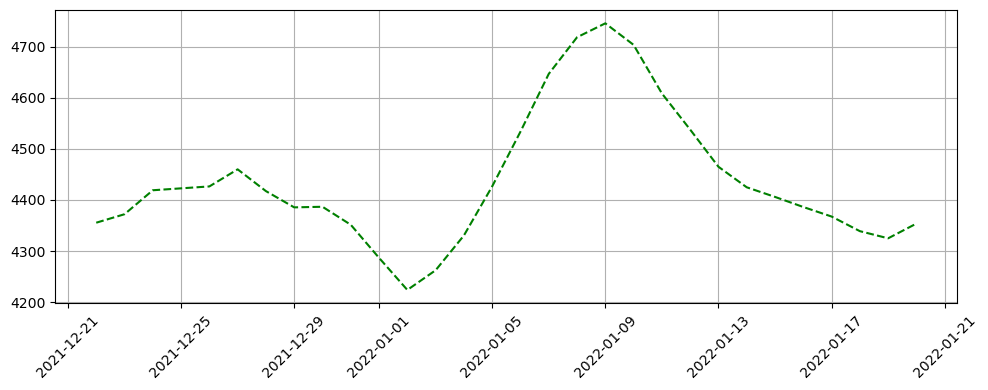

In [180]:
#plotting for next 30 days 
plt.figure(figsize=(10,4))
plt.plot(forecast_final, label='triple_mul_mul_Exp',linestyle = '--',c = 'green')
plt.xticks(rotation =45)
plt.tight_layout()
plt.grid()
plt.show()

# OBSERVATION:
- From the plot, it can be observed that the forecasted values follow a relatively stable trend over the 30-day period. There are no significant spikes or sudden changes in the forecasted values. The overall pattern appears to be relatively smooth.

## Project Analysis

 - We observed that yearly the price of gold from 2016 to 2017 saw a dip in prices of gold but from 2017 fourth quarter the prices started rise till 2020, this might be the factors like pandemic effect or lockdown all over world, the supply would be less which might have made the prices rise up.
 
 
 - From the year 2020 fourth quarter to 2021 we saw the prices falling down as the pandemic was over and the lockdown was lifted, this led to supply and demand of gold normalize which might have good impact on prices to dip down.
 
 
 - when we observe qaurterly and monthly we observe that average price of gold have been rising in the first quarter,and drastically falling in second quarter, with slight drop in third quarter and complete drop in fourth quarter and we have observed the same with monthly data according to the quarters.
 
 
 
 - When we observe the average change  in price for daily we observe that Monday to thursday the price fluctuations are not much affecting, but over the years the avearge gold price have been taking dip every friday,but by friday end the prices of gold drastically rise up on saturday, and on sunday prices fall down.
 
 
 - As we forecast for next 30 days for the year 2022 we observe that its the beginning of the first quarter and we observe the prices of gold rising and for people who are in import and export should wait till second quarter beginning when prices fall down.this also apply  to people who invest on gold.
 
 
 - To conclude avoid first quarter to invest on gold, from second to fourth quarter the prices are dropping down and good time to invest in gold markets, with fourth quarter best time to invest and for better returns sell with beginning of first quarter, but since the gold markets are volatile by nature,the volatility may lead to market risks.
 

## Project Conclusion

 - In this project we have worked on gold prices from the year 2016 to 2021 and forecasting for next 30 days.We have performed a detailed analysis over the gold rates with different kind of Models and methods.
 
 
 - We have performed the necessary data exploration and in data exploration we found out our data is having Additive seasonality and upward trend ,we also observed the distribution of data is a bimodal distribution and rightly skewed.
 
 
 - We checked for outliers and we found that the outliers were very minimal, we had no missing data or duplicate values,since our data is skewed we have to perform some transformations.
 
 
 - We also performed some visualizations for moving average, decomposition plots to check seasonality and trend,yearly,monthly,quarterly and daily price and the percentage change all over the years,for this we used matplotlib and plotly libraries.
 
 
 - We didvided our data into train and test, with taking 3 months as our test data and rest leaving as training data. We first worked on Data driven models, where we applied holts method and computed the train and test RMSE and  also predicted for the test data.
 
 
 - Since our data was not stationary, for ARIMA and SARIMAX we required stationary models we performed ADfuller test, where our P value should be lesser than significant value (ie 0.05), we performed Squareroot,log and BoxCox transformations,but still data was non - stationary we went with differencing which made our model stationary after we performed adfuller test.
 
 
 - With ACF AND PACF plots we found out our parameters for ARIMA model and we fit in the parameters for ARIMA model, since  our predictions were in BoxCox values we have Inversed our values to original. We also found out the RMSE and MAE.
 
 
 - After ARIMA we have performed SARIMAX, we found out parameters for sarimax with Gridsearch CV,With optimal parameters we have fit our model and predicted for test data,Since our predictions in Boxcox values we inversed the values to original.
 
 
 - After Sarimax we performed for model based methods, for model based methods we extracted necessary features required,We fit in all the model based methods and we extacted the summary with its RMSE values
 
 
- After performing all the methods for forecasting of gold price to finalise our model for deployment and future prediction we went with Holts method Triple Exponential Multiplicative Seasonality and trend which gave us best resluts and balanced RMSE values for train and test, niether overfitting or underfitting.



- In this project we found out how gold prices are volatile in market and what are the factors that affect the market of gold, we also observe that in pandemic year what was the drop in gold prices, the supply and demand effect on market, the custom duty on import and export of gold.


 
 